<a href="https://colab.research.google.com/github/BondsonTo/Dissertation-ML-Project/blob/main/ESG_Prediction_Model_Data_v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import libraries and Data

ALL LGSE Unpivot.xlsx comprises of companies ESG score and financial data across the globe, retrieved and transformed from Refinitiv database

(1) Select public companies (Observations) appeared in 5 LSEG Indices:

*   FR Europe (TREUR)
*   FR Japan (TRJP)
*   FR United States (TRUS)
*   FR Latin America (FRLAM)
*   FR Asia Pacific ex Japan (TRAPXJ)

    Each company identified with ISIN code, RIC identifier, industry classification with GICS, fiscal year

(2) Select responses (ROE) and predictors (35 features)

  Financial and moderating Features selected based on the core literatures. All variables are up to latest fiscal year, with some selected variables up to 2 years prior

(3) Merge macro economic data in the same countries of exchange to each companies. Macro economic data retrived from World Bank Open Data:

*   GDP growth (annual %)
*   Inflation, consumer prices (annual %)
*   Unemployment, total (% of total labor force) (modeled ILO estimate)



In [ ]:
import pandas as pd

ALL_LGSE = pd.read_excel('ALL LGSE Unpivot.xlsx',sheet_name='ALL LGSE Unpivot')

In [ ]:
# ALL companies ESG data in pandas DF
ALL_LGSE

,Identifier (RIC),Company Name,GICS Industry Name,IV Latest Fiscal Year Period End Date,ISIN Code,Country of Exchange,Country of Headquarters,Currency Code,GDP_growth_annual,Inflation_annual,...,Social_1,Social_0,ESG_2,ESG_1,ESG_0,ESGCombine_2,ESGCombine_1,ESGCombine_0,Current_ratio_0,Net_sales_0
0,000020.KS,Dongwha Pharm Co Ltd,Pharmaceuticals,2023-12-31,KR7000020008,Korea; Republic (S. Korea),Korea; Republic (S. Korea),KRW,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.23963,2.789776e+08
1,000070.KS,Samyang Holdings Corp,Food Products,2023-12-31,KR7000070003,Korea; Republic (S. Korea),Korea; Republic (S. Korea),KRW,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.38861,2.480573e+09
2,000080.KS,HiteJinro Co Ltd,Beverages,2023-12-31,KR7000080002,Korea; Republic (S. Korea),Korea; Republic (S. Korea),KRW,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.65197,1.655707e+07
3,0001.HK,CK Hutchison Holdings Ltd,Industrial Conglomerates,2023-12-31,KYG217651051,Hong Kong,Hong Kong,HKD,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.24526,3.529122e+10
4,000100.KS,Yuhan Corp,Pharmaceuticals,NaT,KR7000100008,Korea; Republic (S. Korea),Korea; Republic (S. Korea),KRW,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.15445,1.436174e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9412,ZUO.N,Zuora Inc,Software,2024-01-31,US98983V1061,United States,United States of America,USD,1.935635,8.002800,...,54.621377,50.890152,50.889259,49.795045,42.451554,50.889259,49.795045,42.451554,2.42620,4.316610e+08
9413,ZURN.S,Zurich Insurance Group AG,Insurance,2023-12-31,CH0011075394,Switzerland,Switzerland,USD,2.568328,2.835028,...,88.165154,87.216192,88.664728,89.361144,87.801267,50.429925,76.731854,58.400634,NaN,NaN
9414,ZV.MI,Zignago Vetro SpA,Containers & Packaging,2023-12-31,IT0004171440,Italy,Italy,EUR,3.724549,8.201290,...,63.071878,83.956606,55.822382,63.310890,67.456872,55.822382,63.310890,67.456872,1.52375,5.738327e+08
9415,ZWS.N,Zurn Elkay Water Solutions Corp,Building Products,2023-12-31,US98983L1089,United States,United States of America,USD,1.935635,8.002800,...,86.183395,85.944923,66.415707,74.567523,74.026288,66.415707,74.567523,74.026288,3.02309,1.530500e+09


In [ ]:
ALL_LGSE.columns

Index(['Identifier (RIC)', 'Company Name', 'GICS Industry Name',
       'IV Latest Fiscal Year Period End Date', 'ISIN Code',
       'Country of Exchange', 'Country of Headquarters', 'Currency Code',
       'GDP_growth_annual', 'Inflation_annual', 'Umployment',
       'Environmental_2', 'Environmental_0', 'Environmental_1', 'CapExp_0',
       'Total_debt_0', 'DE_0', 'CapExp_2', 'CapExp_1', 'Intangibles_net_0',
       'Beta_5yr_monthly', 'PE_0', 'EBITDA_2', 'ROE', 'EBITDA_1', 'EBITDA_0',
       'Market_Cap', 'DE_1', 'PE_2', 'PE_1', 'PM_2', 'PM_1', 'PM_0',
       'Governance_2', 'Governance_1', 'Governance_0', 'Social_2', 'Social_1',
       'Social_0', 'ESG_2', 'ESG_1', 'ESG_0', 'ESGCombine_2', 'ESGCombine_1',
       'ESGCombine_0', 'Current_ratio_0', 'Net_sales_0'],
      dtype='object')

In [ ]:
ALL_LGSE['IV Latest Fiscal Year Period End Date'].unique()

<DatetimeArray>
['2023-12-31 00:00:00',                 'NaT', '2023-06-30 00:00:00',
 '2023-03-31 00:00:00', '2024-03-31 00:00:00', '2022-12-31 00:00:00',
 '2023-08-31 00:00:00', '2023-05-31 00:00:00', '2023-04-30 00:00:00',
 '2022-05-31 00:00:00', '2024-01-31 00:00:00', '2023-09-30 00:00:00',
 '2024-02-28 00:00:00', '2023-10-31 00:00:00', '2023-02-28 00:00:00',
 '2023-07-31 00:00:00', '2023-11-30 00:00:00', '2024-02-29 00:00:00',
 '2024-04-30 00:00:00', '2023-01-31 00:00:00']
Length: 20, dtype: datetime64[ns]

# 1. Data Cleaning

Dropped Duplicates and missing value

(1) Observations without ROE or ESG Score are dropped

(2) Observations with duplicated name are dropped

In [ ]:
#Drop missing data in ROE (response) and ESGComine (Main predictor)
ALL_LGSE = ALL_LGSE.dropna(subset=['ROE','ESGCombine_0'])

ALL_LGSE = ALL_LGSE.dropna(subset=['GICS Industry Name'])

#Drop duplicates on company name
ALL_LGSE = ALL_LGSE.drop_duplicates(subset=['Company Name'])

#Correct spelling of unemployment rate column
ALL_LGSE.rename(columns={'Umployment':'Unemployment'}, inplace=True)

ALL_LGSE

,Identifier (RIC),Company Name,GICS Industry Name,IV Latest Fiscal Year Period End Date,ISIN Code,Country of Exchange,Country of Headquarters,Currency Code,GDP_growth_annual,Inflation_annual,...,Social_1,Social_0,ESG_2,ESG_1,ESG_0,ESGCombine_2,ESGCombine_1,ESGCombine_0,Current_ratio_0,Net_sales_0
862,1332.T,Nissui Corp,Food Products,2024-03-31,JP3718800000,Japan,Japan,JPY,0.954737,2.497703,...,40.601295,45.830715,43.686395,44.210228,48.700470,43.686395,44.210228,48.700470,1.52793,5.494515e+09
934,1518.T,Mitsui Matsushima Holdings Co Ltd,Trading Companies & Distributors,2023-03-31,JP3894000003,Japan,Japan,JPY,0.954737,2.497703,...,NaN,11.376592,NaN,NaN,26.040962,NaN,NaN,26.040962,2.89735,5.120085e+08
959,1605.T,Inpex Corp,"Oil, Gas & Consumable Fuels",2023-12-31,JP3294460005,Japan,Japan,JPY,0.954737,2.497703,...,68.283303,69.546345,63.290104,72.369075,73.649969,63.290104,72.369075,73.649969,1.46522,1.534465e+10
977,1662.T,Japan Petroleum Exploration Co Ltd,"Oil, Gas & Consumable Fuels",2024-03-31,JP3421100003,Japan,Japan,JPY,0.954737,2.497703,...,80.685031,83.201342,72.464588,71.854946,75.002469,72.464588,71.854946,75.002469,5.08744,2.153612e+09
1006,1721.T,Comsys Holdings Corp,Construction & Engineering,2024-03-31,JP3305530002,Japan,Japan,JPY,0.954737,2.497703,...,17.372831,19.992356,22.752747,31.649301,27.876720,22.752747,31.649301,27.876720,2.43187,3.774939e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9407,ZNTL.OQ,Zentalis Pharmaceuticals Inc,Biotechnology,NaT,US98943L1070,United States,United States of America,USD,1.935635,8.002800,...,44.796135,41.202925,30.554674,38.990254,28.924302,30.554674,38.990254,28.924302,7.16072,NaN
9409,ZS.OQ,Zscaler Inc,Software,2023-07-31,NaN,United States,United States of America,USD,1.935635,8.002800,...,52.322141,61.961781,31.019512,34.007737,39.668664,31.019512,34.007737,39.668664,1.88188,1.616952e+09
9410,ZTS.N,Zoetis Inc,Pharmaceuticals,2023-12-31,US98978V1035,United States,United States of America,USD,1.935635,8.002800,...,77.096405,77.375621,64.691878,65.715257,71.809137,64.691878,65.715257,71.809137,3.35786,8.544000e+09
9412,ZUO.N,Zuora Inc,Software,2024-01-31,US98983V1061,United States,United States of America,USD,1.935635,8.002800,...,54.621377,50.890152,50.889259,49.795045,42.451554,50.889259,49.795045,42.451554,2.42620,4.316610e+08


In [ ]:
len(ALL_LGSE['GDP_growth_annual'].dropna())

3642

In [ ]:
#Data Description

ALL_LGSE.describe()

,IV Latest Fiscal Year Period End Date,GDP_growth_annual,Inflation_annual,Unemployment,Environmental_2,Environmental_0,Environmental_1,CapExp_0,Total_debt_0,DE_0,...,Social_1,Social_0,ESG_2,ESG_1,ESG_0,ESGCombine_2,ESGCombine_1,ESGCombine_0,Current_ratio_0,Net_sales_0
count,3024,3642.000000,3636.000000,3642.000000,3434.000000,3664.000000,3535.000000,3.556000e+03,3.643000e+03,3501.000000,...,3535.000000,3664.000000,3434.000000,3535.000000,3664.000000,3434.000000,3535.000000,3664.000000,3067.000000,3.103000e+03
mean,2023-12-28 19:46:40.000000256,2.144523,7.173621,4.116947,42.594339,46.386035,44.952592,6.815477e+08,8.195827e+09,2.915600,...,55.475545,56.165082,51.504101,53.028884,53.690681,49.796826,51.442483,50.257203,2.411653,9.937564e+09
min,2023-01-31 00:00:00,0.954737,2.497703,2.600000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,...,0.248795,0.425118,1.158935,1.650151,2.868312,1.158935,1.650151,2.868312,0.021260,-6.234426e+09
25%,2023-12-31 00:00:00,1.935635,7.922049,3.650000,14.756102,23.066303,19.671165,3.059501e+07,2.592500e+08,0.548748,...,38.767033,40.578831,35.097573,37.822580,38.830158,34.738261,37.268483,37.155978,1.110180,8.186730e+08
50%,2023-12-31 00:00:00,1.935635,8.002800,3.650000,43.505381,48.951962,46.459581,1.212655e+08,1.244300e+09,1.238683,...,56.362066,57.565156,52.338347,54.600240,55.595866,50.369513,52.369226,51.030796,1.637960,2.519886e+09
75%,2023-12-31 00:00:00,1.935635,8.002800,3.650000,68.695985,70.041067,69.520858,4.480102e+08,4.422500e+09,2.455081,...,73.192092,73.453051,67.966365,69.205163,69.004577,65.062948,66.352724,64.146921,2.568900,7.166200e+09
max,2024-04-30 00:00:00,6.827511,14.608144,12.920000,98.660019,99.257725,98.644427,5.272900e+10,1.069803e+12,826.475661,...,98.353196,97.653985,95.142997,95.566174,95.473628,95.107221,94.032440,92.415291,49.214290,6.481250e+11
std,NaN,0.898793,2.079933,1.748428,29.635964,27.898452,28.712635,2.268966e+09,3.862400e+10,16.684715,...,21.888955,21.404946,20.526338,19.881310,19.385994,19.446632,18.992100,17.994436,2.786427,3.089701e+10


Extreme ROE value identified and exclusion of outliers are considered

In [ ]:
# Response ROE Description

ALL_LGSE['ROE'].describe()

,ROE
count,3664.000000
mean,8.601112
std,420.670636
min,-11168.983900
25%,5.338767
50%,11.627709
75%,19.976451
max,18112.278020


In [ ]:
#Get header column as features

features = list(ALL_LGSE.columns)
del features[:8] #features starts from 9th column

#Prepare list of countries and industries for calculation of averages

country = list(ALL_LGSE["Country of Exchange"].unique())
gic_industry = list (ALL_LGSE["GICS Industry Name"].unique())

features

['GDP_growth_annual',
 'Inflation_annual',
 'Unemployment',
 'Environmental_2',
 'Environmental_0',
 'Environmental_1',
 'CapExp_0',
 'Total_debt_0',
 'DE_0',
 'CapExp_2',
 'CapExp_1',
 'Intangibles_net_0',
 'Beta_5yr_monthly',
 'PE_0',
 'EBITDA_2',
 'ROE',
 'EBITDA_1',
 'EBITDA_0',
 'Market_Cap',
 'DE_1',
 'PE_2',
 'PE_1',
 'PM_2',
 'PM_1',
 'PM_0',
 'Governance_2',
 'Governance_1',
 'Governance_0',
 'Social_2',
 'Social_1',
 'Social_0',
 'ESG_2',
 'ESG_1',
 'ESG_0',
 'ESGCombine_2',
 'ESGCombine_1',
 'ESGCombine_0',
 'Current_ratio_0',
 'Net_sales_0']

In [ ]:
#Define function: Created SINGLE list of calculated average for a SINGLE feature

def calculate_avg(df,category_colname,selectedfeature):
  df = df.dropna(subset=[category_colname]) #Get away missing value in selected_item list
  selected_item = list(df[category_colname].unique())
  result = []
  for i in selected_item:
    temp = df[df[category_colname]==i]
    avg = sum(list(temp[selectedfeature].dropna()))/len(temp) #.dropna ensure missing value not affect the calculation
    result.append(avg)
  return result;

In [ ]:
# @title Average value of features by country
# Create the dataframe for calculated averaged for ALL features by country

country = list(ALL_LGSE["Country of Exchange"].unique())
feature_avgtable_c = pd.DataFrame({'Country':country})

for j in features:
  temp2 = calculate_avg(ALL_LGSE,'Country of Exchange',j)
  feature_avgtable_c[j]=temp2

feature_avgtable_c


,Country,GDP_growth_annual,Inflation_annual,Unemployment,Environmental_2,Environmental_0,Environmental_1,CapExp_0,Total_debt_0,DE_0,...,Social_1,Social_0,ESG_2,ESG_1,ESG_0,ESGCombine_2,ESGCombine_1,ESGCombine_0,Current_ratio_0,Net_sales_0
0,Japan,0.954737,2.497703,2.600,50.914505,56.812132,53.770025,6.717692e+08,1.003220e+10,2.036431,...,48.285837,51.660344,48.447284,50.683246,53.258535,47.774157,50.206202,52.024501,2.137884,9.251747e+09
1,Germany,1.806209,6.872574,3.140,63.150635,66.992713,65.612978,1.495927e+09,1.676168e+10,1.934576,...,75.391075,74.980060,67.464893,70.162024,70.904940,63.153098,65.520228,63.801625,1.474289,2.113401e+10
2,United States,1.935635,8.002800,3.650,30.604395,37.714276,34.227952,6.113423e+08,6.793533e+09,2.992379,...,49.492722,52.537178,43.152886,46.428949,49.506173,41.874880,45.060421,45.817958,2.240372,8.415274e+09
3,Spain,5.770648,8.390576,12.920,73.703099,77.278780,74.724296,1.851108e+09,2.860159e+10,2.718377,...,83.210458,84.994420,72.748381,74.237952,75.587430,67.744769,69.785964,67.744751,1.139294,7.353130e+09
4,United Kingdom,4.346561,7.922049,3.730,60.395380,63.566100,62.646164,9.488914e+08,1.359525e+10,2.152929,...,66.045378,66.457339,65.413125,66.192796,66.849649,60.344706,61.972200,59.180707,1.435424,1.228700e+10
5,Sweden,2.911772,8.369291,7.390,42.502686,48.286175,45.912414,1.513332e+08,3.354208e+09,1.949320,...,56.571199,57.733828,52.824974,54.661361,55.771368,52.186378,54.201925,54.278638,1.774786,2.870306e+09
6,Netherlands,4.328918,10.001208,3.520,56.527382,61.204817,58.127950,7.188556e+08,1.419191e+10,10.131071,...,69.808495,69.558014,61.787482,64.734210,64.918726,59.607400,63.563424,62.513279,1.809882,1.204763e+10
7,Switzerland,2.568328,2.835028,4.300,56.129710,58.208581,57.710918,9.005441e+08,1.549858e+10,4.606670,...,68.231926,69.627540,64.375470,65.340883,66.381242,60.721284,62.204353,61.671303,1.876162,1.049875e+10
8,Brazil,2.900531,9.280106,9.230,42.449467,53.165627,49.529689,5.585844e+08,8.511233e+09,3.383022,...,54.209806,58.056218,46.499904,51.702196,54.999411,44.819108,49.961403,53.582409,1.511490,7.025682e+08
9,Mexico,3.898231,7.896276,3.260,44.189927,54.282727,50.062261,6.652935e+08,4.313345e+09,2.404361,...,58.990654,63.965624,48.160240,54.819918,58.854142,47.913223,54.502878,58.037541,1.918558,7.430151e+09


In [ ]:
# @title Average value of features by industry
# Create the dataframe for calculated averaged for ALL features by industry

gic_industry = list (ALL_LGSE["GICS Industry Name"].unique())
feature_avgtable_i = pd.DataFrame({'GICS Industry':gic_industry})

for j in features:
  temp2 = calculate_avg(ALL_LGSE,'GICS Industry Name',j)
  feature_avgtable_i[j]=temp2

#drop variables which are country specific with no meanings industry-wise
feature_avgtable_i.drop(['GDP_growth_annual','Inflation_annual','Unemployment'],axis=1)

feature_avgtable_i

,GICS Industry,GDP_growth_annual,Inflation_annual,Unemployment,Environmental_2,Environmental_0,Environmental_1,CapExp_0,Total_debt_0,DE_0,...,Social_1,Social_0,ESG_2,ESG_1,ESG_0,ESGCombine_2,ESGCombine_1,ESGCombine_0,Current_ratio_0,Net_sales_0
0,Food Products,2.177094,6.431619,4.183373,56.827185,61.756129,59.512730,4.411521e+08,3.792074e+09,2.180883,...,60.557233,62.643007,55.949692,58.864955,60.201351,53.210735,56.063210,54.135220,2.024458,9.360705e+09
1,Trading Companies & Distributors,2.132219,6.724595,3.763393,38.063052,41.623882,38.998547,5.978556e+08,5.537863e+09,2.166407,...,46.073743,49.593850,44.178806,45.767502,49.071065,43.862746,45.740949,48.580406,1.866314,1.427789e+10
2,"Oil, Gas & Consumable Fuels",2.368275,7.568780,4.274402,42.928393,46.164967,45.479414,2.286491e+09,7.554324e+09,1.716985,...,51.372005,52.892716,47.845604,51.185812,52.310128,44.627624,47.664360,46.522021,1.513890,2.221228e+10
3,Construction & Engineering,1.941469,6.265587,3.879362,42.293496,48.652226,46.359339,2.472973e+08,1.930957e+09,1.339796,...,48.212694,52.756813,44.974171,48.958398,52.100932,44.662836,48.773513,49.943270,1.474658,7.955458e+09
4,Household Durables,2.076700,7.032266,4.453226,44.579101,51.569828,47.144730,2.407949e+08,2.099017e+09,1.486445,...,51.322263,54.808284,48.648311,51.098147,53.508191,46.783690,49.825487,50.246162,1.706165,8.083019e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69,Water Utilities,2.678102,8.727586,5.395333,51.133572,49.982234,50.454778,6.532337e+08,4.062345e+09,3.014839,...,53.585543,53.105467,54.806064,54.034569,53.602170,54.806064,53.851572,50.634850,1.289939,4.234154e+08
70,Residential REITs,1.935635,8.002800,3.650000,43.907556,49.619187,46.707721,4.689509e+08,4.206255e+09,2.279863,...,57.684886,59.457346,55.336283,56.030765,59.600884,55.103458,56.030765,58.701392,0.000000,1.419942e+09
71,Energy Equipment & Services,2.414601,7.481132,3.925778,43.397294,55.326540,52.680844,3.356826e+08,1.702460e+09,1.837767,...,60.115221,61.389320,50.330008,57.251230,59.553961,48.875622,55.186711,57.196625,1.935974,4.752563e+09
72,Specialized REITs,2.136545,7.996071,3.656667,48.656455,55.121518,51.457625,7.021672e+08,8.334042e+09,5.190937,...,58.256134,56.556116,55.070197,59.262141,59.021248,54.849773,59.262141,57.670306,0.495031,2.947840e+09


In [ ]:
# Find non-numeric columns
non_numeric_cols = feature_avgtable_i.select_dtypes(exclude='number').columns

print(non_numeric_cols)

Index(['GICS Industry'], dtype='object')


ALL_LGSE_R Compared to original ALL_LGSE:

(3) With remaining features containing missing values. Missing data are filled with average of same industry

(4) Exclude companies with extreme value of ROE, defined as 3 s.d. above or below mean




In [ ]:
# filling up zero variable values by average of the same industry

# Initialize a blank data frame
ALL_LGSE_R = pd.DataFrame()

for i in gic_industry:
  temp_df = ALL_LGSE[ALL_LGSE['GICS Industry Name']==i]
  for j in features: #features for the modelling written in list earlier
    temp_df[j] = temp_df[j].fillna(temp_df[j].mean())
  ALL_LGSE_R = pd.concat([ALL_LGSE_R,temp_df], ignore_index=True)

ALL_LGSE_R

<ipython-input-54-f4792b3be7f4>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df[j] = temp_df[j].fillna(temp_df[j].mean())
<ipython-input-54-f4792b3be7f4>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df[j] = temp_df[j].fillna(temp_df[j].mean())
<ipython-input-54-f4792b3be7f4>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

,Identifier (RIC),Company Name,GICS Industry Name,IV Latest Fiscal Year Period End Date,ISIN Code,Country of Exchange,Country of Headquarters,Currency Code,GDP_growth_annual,Inflation_annual,...,Social_1,Social_0,ESG_2,ESG_1,ESG_0,ESGCombine_2,ESGCombine_1,ESGCombine_0,Current_ratio_0,Net_sales_0
0,1332.T,Nissui Corp,Food Products,2024-03-31,JP3718800000,Japan,Japan,JPY,0.954737,2.497703,...,40.601295,45.830715,43.686395,44.210228,48.700470,43.686395,44.210228,48.700470,1.52793,5.494515e+09
1,2001.T,Nippn Corp,Food Products,2023-03-31,JP3723000000,Japan,Japan,JPY,0.954737,2.497703,...,12.045239,32.938481,13.505825,14.985541,33.885388,13.505825,14.985541,33.885388,1.86912,2.646976e+09
2,2002.T,Nisshin Seifun Group Inc,Food Products,2024-03-31,JP3676800000,Japan,Japan,JPY,0.954737,2.497703,...,61.471610,67.032600,62.030694,67.369730,67.522095,62.030694,67.369730,67.522095,2.23189,5.672117e+09
3,2206.T,Ezaki Glico Co Ltd,Food Products,2023-12-31,JP3161200005,Japan,Japan,JPY,0.954737,2.497703,...,76.149214,74.801309,64.602516,67.071005,69.703007,64.602516,67.071005,69.703007,1.62482,2.357791e+09
4,2212.T,Yamazaki Baking Co Ltd,Food Products,2023-12-31,JP3935600001,Japan,Japan,JPY,0.954737,2.497703,...,9.136177,8.860457,8.481483,8.167505,8.750584,8.481483,8.167505,8.750584,1.22069,8.333773e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3659,RHP.N,Ryman Hospitality Properties Inc,Hotel & Resort REITs,2023-12-31,US78377T1079,United States,United States of America,USD,1.935635,8.002800,...,66.471354,69.250531,48.856926,57.970264,66.108476,48.856926,57.970264,66.108476,3.79329,2.158136e+09
3660,RLJ.N,RLJ Lodging Trust,Hotel & Resort REITs,2023-12-31,US74965L1017,United States,United States of America,USD,1.935635,8.002800,...,32.067749,31.952318,38.942746,38.778648,37.755445,38.942746,38.778648,37.755445,3.79329,1.325577e+09
3661,SHO.N,Sunstone Hotel Investors Inc,Hotel & Resort REITs,NaT,US8678921011,United States,United States of America,USD,1.935635,8.002800,...,73.628312,68.439143,78.008691,74.457258,71.271659,78.008691,74.457258,71.271659,3.79329,9.864800e+08
3662,SVC.OQ,Service Properties Trust,Hotel & Resort REITs,2023-12-31,US81761L1026,United States,United States of America,USD,1.935635,8.002800,...,30.389510,29.401533,28.997981,27.004629,26.572351,28.997981,27.004629,26.572351,3.79329,1.873863e+09


In [ ]:
# @title Fill up NaN value

# Get a boolean dataframe indicating the location of NaN values
nan_mask = ALL_LGSE_R.isnull()

# Get the row and column indices of NaN values
nan_rows, nan_cols = nan_mask.any(axis=1), nan_mask.any(axis=0)

# Print the row and column indices with NaN values
print("Rows with NaN values:", nan_rows[nan_rows].index.tolist())
print("Columns with NaN values:", nan_cols[nan_cols].index.tolist())

Rows with NaN values: [29, 30, 48, 65, 70, 74, 101, 124, 138, 141, 147, 154, 155, 160, 166, 169, 173, 174, 183, 186, 188, 194, 197, 202, 205, 213, 219, 227, 234, 235, 237, 238, 240, 241, 245, 246, 250, 262, 269, 310, 315, 317, 328, 348, 354, 359, 361, 362, 364, 384, 385, 392, 397, 398, 404, 407, 411, 412, 415, 417, 419, 430, 431, 452, 461, 465, 470, 472, 476, 477, 480, 504, 511, 514, 515, 520, 523, 528, 534, 540, 542, 546, 547, 549, 552, 560, 561, 565, 569, 571, 578, 581, 587, 601, 640, 641, 644, 676, 677, 693, 700, 702, 735, 747, 763, 765, 787, 792, 794, 797, 798, 818, 821, 824, 827, 828, 830, 833, 843, 845, 848, 857, 861, 867, 874, 884, 886, 893, 895, 946, 971, 982, 1002, 1006, 1011, 1012, 1018, 1024, 1030, 1033, 1058, 1077, 1085, 1090, 1095, 1097, 1117, 1122, 1126, 1127, 1133, 1134, 1137, 1142, 1175, 1185, 1186, 1189, 1191, 1193, 1207, 1214, 1217, 1219, 1226, 1231, 1234, 1236, 1237, 1240, 1244, 1248, 1255, 1261, 1262, 1266, 1272, 1273, 1298, 1305, 1306, 1307, 1310, 1384, 1389, 1390,

In [ ]:
ALL_LGSE_R[['Current_ratio_0','PE_2']].describe()

,Current_ratio_0,PE_2
count,3621.000000,3653.000000
mean,2.386225,62.186675
std,2.588605,265.465832
min,0.021260,0.427227
25%,1.134141,15.356808
50%,1.695750,29.089489
75%,2.637140,57.082476
max,49.214290,12429.411765


In [ ]:
# Fill up Nan value in PE_2 and Current_ratio_0 with column average

ALL_LGSE_R['PE_2'] = ALL_LGSE_R['PE_2'].fillna(ALL_LGSE_R['PE_2'].mean())
ALL_LGSE_R['Current_ratio_0'] = ALL_LGSE_R['Current_ratio_0'].fillna(ALL_LGSE_R['Current_ratio_0'].mean())

In [ ]:
ALL_LGSE_R.describe()

,IV Latest Fiscal Year Period End Date,GDP_growth_annual,Inflation_annual,Unemployment,Environmental_2,Environmental_0,Environmental_1,CapExp_0,Total_debt_0,DE_0,...,Social_1,Social_0,ESG_2,ESG_1,ESG_0,ESGCombine_2,ESGCombine_1,ESGCombine_0,Current_ratio_0,Net_sales_0
count,3024,3664.000000,3664.000000,3664.000000,3664.000000,3664.000000,3664.000000,3.664000e+03,3.664000e+03,3664.000000,...,3664.000000,3664.000000,3664.000000,3664.000000,3664.000000,3664.000000,3664.000000,3664.000000,3664.000000,3.664000e+03
mean,2023-12-28 19:46:40.000000256,2.145009,7.173696,4.117793,42.362073,46.386035,44.888208,6.729581e+08,8.176613e+09,2.997387,...,55.465848,56.165082,51.383249,52.993525,53.690681,49.686495,51.413548,50.257203,2.386225,9.721334e+09
min,2023-01-31 00:00:00,0.954737,2.497703,2.600000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,...,0.248795,0.425118,1.158935,1.650151,2.868312,1.158935,1.650151,2.868312,0.021260,-6.234426e+09
25%,2023-12-31 00:00:00,1.935635,7.896276,3.650000,16.201504,23.066303,20.510102,3.196250e+07,2.619935e+08,0.573714,...,39.655924,40.578831,35.831411,38.175572,38.830158,35.528099,37.816060,37.155978,1.134141,1.026611e+09
50%,2023-12-31 00:00:00,1.935635,8.002800,3.650000,42.969889,48.951962,46.416617,1.269725e+08,1.260483e+09,1.291380,...,56.272196,57.565156,51.947928,54.255600,55.595866,50.166766,52.334307,51.030796,1.710590,3.296917e+09
75%,2023-12-31 00:00:00,1.935635,8.002800,3.650000,66.756522,70.041067,68.934257,4.416510e+08,4.420250e+09,2.629768,...,72.483546,73.453051,66.941068,68.602124,69.004577,64.023567,65.968834,64.146921,2.637140,8.190012e+09
max,2024-04-30 00:00:00,6.827511,14.608144,12.920000,98.660019,99.257725,98.644427,5.272900e+10,1.069803e+12,826.475661,...,98.353196,97.653985,95.142997,95.566174,95.473628,95.107221,94.032440,92.415291,49.214290,6.481250e+11
std,NaN,0.896246,2.072585,1.743329,28.953893,27.898452,28.319326,2.237195e+09,3.851896e+10,16.325239,...,21.524479,21.404946,19.968167,19.571404,19.385994,18.917506,18.698353,17.994436,2.573366,2.864709e+10


In [ ]:
# Get a boolean dataframe indicating the location of NaN values
nan_mask = ALL_LGSE_R.isnull()

# Get the row and column indices of NaN values
nan_rows, nan_cols = nan_mask.any(axis=1), nan_mask.any(axis=0)

# Print the row and column indices with NaN values
print("Rows with NaN values:", nan_rows[nan_rows].index.tolist())
print("Columns with NaN values:", nan_cols[nan_cols].index.tolist())

Rows with NaN values: [29, 30, 48, 65, 70, 74, 101, 124, 138, 141, 147, 154, 155, 160, 166, 169, 173, 174, 183, 186, 188, 194, 197, 202, 205, 213, 219, 227, 234, 235, 237, 238, 240, 241, 245, 246, 250, 262, 269, 310, 315, 317, 328, 348, 354, 359, 361, 362, 364, 384, 385, 392, 397, 398, 404, 407, 411, 412, 415, 417, 419, 430, 431, 452, 461, 465, 470, 472, 476, 477, 480, 504, 511, 514, 515, 520, 523, 528, 534, 540, 542, 546, 547, 549, 552, 560, 561, 565, 569, 571, 578, 581, 587, 601, 640, 641, 644, 676, 677, 693, 700, 702, 735, 747, 763, 765, 787, 792, 794, 797, 798, 818, 821, 824, 827, 828, 830, 833, 843, 845, 848, 857, 861, 867, 874, 884, 886, 893, 895, 946, 971, 982, 1002, 1006, 1011, 1012, 1018, 1024, 1030, 1033, 1058, 1077, 1085, 1090, 1095, 1097, 1117, 1122, 1126, 1127, 1133, 1134, 1137, 1142, 1175, 1185, 1186, 1189, 1191, 1193, 1207, 1214, 1217, 1219, 1226, 1231, 1234, 1236, 1237, 1240, 1244, 1248, 1255, 1261, 1262, 1266, 1272, 1273, 1298, 1305, 1306, 1307, 1310, 1384, 1389, 1390,

In [ ]:
# @title Remove OLI
# Calculate standardized ROE for outlier detection

ROE_mean = ALL_LGSE_R['ROE'].mean()
ROE_std = ALL_LGSE_R['ROE'].std()

temp_list=[]
for j in range(ALL_LGSE_R.shape[0]):
  std_ROE = (ALL_LGSE_R.loc[j,'ROE']-ROE_mean)/ROE_std
  temp_list.append(std_ROE)
ALL_LGSE_R['std_ROE']=temp_list

In [ ]:
# Excluded outliers as 3 s.d. beyond ROE mean

ALL_LGSE_R = ALL_LGSE_R[(ALL_LGSE_R['std_ROE']>=-3.0) & (ALL_LGSE_R['std_ROE']<=3.0)]

In [ ]:
# Define masks to be applied on ALL_LGSE_R

# Mask 1: ROE under 100 and over 100 are considered as no real meaning
Mask_within100 = ((ALL_LGSE_R['ROE']>=-100) & (ALL_LGSE_R['ROE']<=100))

# Mask 2: ROE over and under 3 s.d. are excluded
Mask_within_3sd = ((ALL_LGSE_R['std_ROE']>=-3.0) & (ALL_LGSE_R['std_ROE']<=3.0))

In [ ]:
# Checking on the ROE with extreme values
# Negative NI and equity can result in abnormal high ROE ratios

Mask_outside100 = ((ALL_LGSE_R['ROE']<=-100) | (ALL_LGSE_R['ROE']>=100))

ALL_LGSE_R[Mask_outside100][['ROE','PM_0','Market_Cap']].describe()

,ROE,PM_0,Market_Cap
count,142.000000,142.000000,1.420000e+02
mean,3.105383,-20.162630,6.598448e+10
std,318.361210,102.961535,3.422633e+11
min,-878.429273,-937.614148,8.459801e+07
25%,-191.161098,-1.111962,1.111629e+09
50%,101.044686,0.033721,4.687617e+09
75%,168.069180,0.149146,1.841757e+10
max,1206.936124,0.546644,2.917922e+12


In subsequent model building, ROE > 100 and <-100 was excluded

In [ ]:
#Export ALL_LGSE_R into excel

ALL_LGSE_R[Mask_within100].to_excel('ALL LGSE Cleaned ESG data.xlsx',sheet_name='ESG Data')

# Exploratory Data Analysis (EDA)

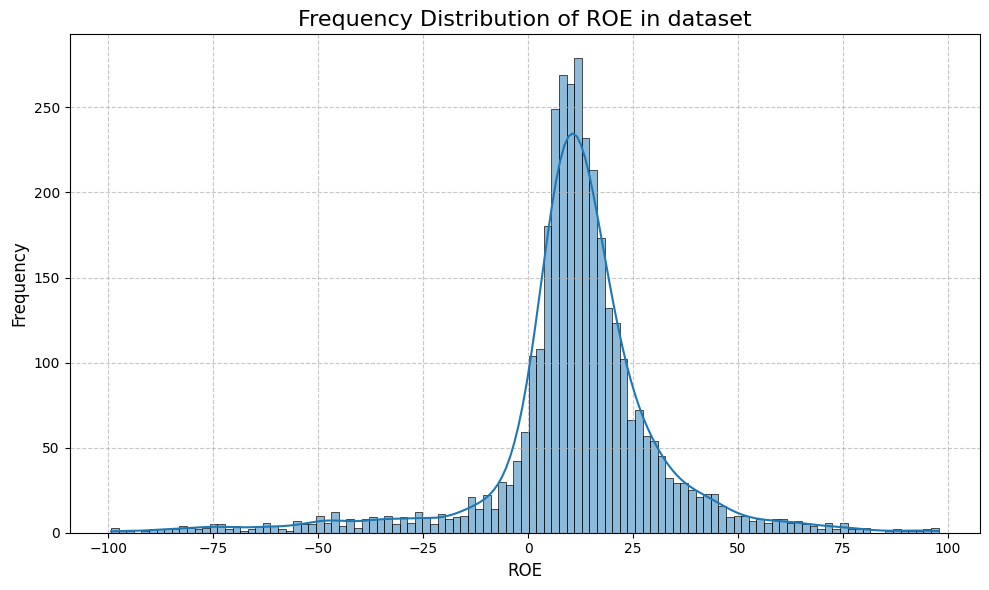

In [ ]:
# @title Histogram for ROE

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Set the style for the plot (optional, but makes it look nicer)
# plt.style.use('seaborn')

# Create the plot
plt.figure(figsize=(10, 6))

# Plot the histogram
sns.histplot(data=ALL_LGSE_R[Mask_within100], x='ROE', kde=True)

# Customize the plot
plt.title('Frequency Distribution of ROE in dataset', fontsize=16)
plt.xlabel('ROE', fontsize=12)
plt.ylabel('Frequency', fontsize=12)

# Add grid lines
plt.grid(True, linestyle='--', alpha=0.7)

# Save the plot
plt.savefig('frequency_distribution_D.png', dpi=600, bbox_inches='tight')

# Show the plot
plt.tight_layout()
plt.show()

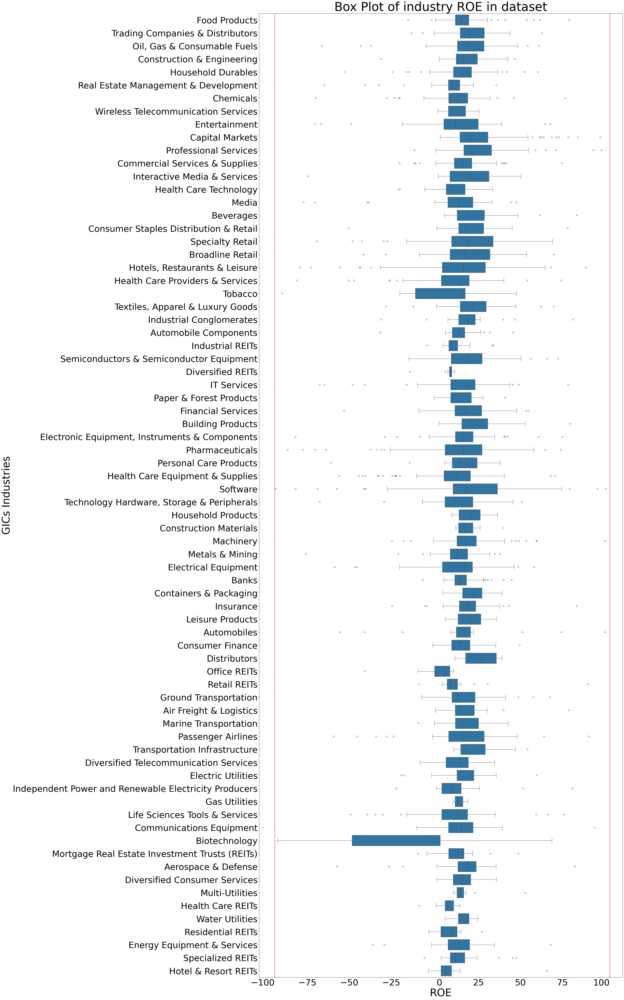

In [ ]:
# @title Box Plot across Industries

import seaborn as sns
import matplotlib.pyplot as plt

# Set the figure size (width, height) in inches
plt.figure(figsize=(30, 80))  # Adjust width (20) as needed

# Assuming your dataframe is named 'df'
sns.boxplot(y='GICS Industry Name', x='ROE', data=ALL_LGSE_R[Mask_within100])

# Set axis label font size
plt.title('Box Plot of industry ROE in dataset', fontsize=56)
plt.ylabel('GICs Industries', fontsize=48)  # Adjust fontsize as needed
plt.xlabel('ROE', fontsize=48)

# Add vertical lines at ROE = -100 and ROE = 100
plt.axvline(x=-100, color='red', linestyle='--', linewidth=2)
plt.axvline(x=100, color='red', linestyle='--', linewidth=2)

# Set tick label font size
plt.xticks(fontsize=40, rotation=0, ha='right')  # Adjust fontsize as needed
plt.yticks(fontsize=40)

# Save the plot
plt.savefig('Box_Plot_ROE_by_industry.png', dpi=300, bbox_inches='tight')

plt.show()

In [ ]:
ALL_LGSE['ROE'].kurt()

1190.4635066722465

From above plot, highly kurtosis ROE (Highly concentrated peak and long tails)

In [ ]:
# @title Features and Variables in list
output_var=['ROE']

features_ESG=['ESGCombine_0','ESGCombine_1','ESGCombine_2',
              'ESG_0','ESG_1','ESG_2',
              'Environmental_0','Environmental_1','Environmental_2',
              'Social_0','Social_1','Social_2',
              'Governance_0','Governance_1','Governance_2'
              ]

features_financials=['Net_sales_0',
                     'EBITDA_0','EBITDA_1','EBITDA_2',
                     'PM_0','PM_1','PM_2',
                     ]

features_ratios=['Current_ratio_0',
                 'DE_0','DE_1',
                 'PE_0','PE_1','PE_2',
                 ]

features_others=['CapExp_0','CapExp_1','CapExp_2',
                 'Intangibles_net_0','Market_Cap',
                 'Total_debt_0',
                 'Beta_5yr_monthly'
                 ]

features_macro=['GDP_growth_annual','Inflation_annual','Unemployment']

features = output_var+features_ESG+features_financials+features_others+features_ratios+features_macro

features

['ROE',
 'ESGCombine_0',
 'ESGCombine_1',
 'ESGCombine_2',
 'ESG_0',
 'ESG_1',
 'ESG_2',
 'Environmental_0',
 'Environmental_1',
 'Environmental_2',
 'Social_0',
 'Social_1',
 'Social_2',
 'Governance_0',
 'Governance_1',
 'Governance_2',
 'Net_sales_0',
 'EBITDA_0',
 'EBITDA_1',
 'EBITDA_2',
 'PM_0',
 'PM_1',
 'PM_2',
 'CapExp_0',
 'CapExp_1',
 'CapExp_2',
 'Intangibles_net_0',
 'Market_Cap',
 'Total_debt_0',
 'Beta_5yr_monthly',
 'Current_ratio_0',
 'DE_0',
 'DE_1',
 'PE_0',
 'PE_1',
 'PE_2',
 'GDP_growth_annual',
 'Inflation_annual',
 'Unemployment']

In [ ]:
#Get subset for numerical features only dataframe
Features_df = ALL_LGSE_R[Mask_within100][features]

Features_df

,ROE,ESGCombine_0,ESGCombine_1,ESGCombine_2,ESG_0,ESG_1,ESG_2,Environmental_0,Environmental_1,Environmental_2,...,Beta_5yr_monthly,Current_ratio_0,DE_0,DE_1,PE_0,PE_1,PE_2,GDP_growth_annual,Inflation_annual,Unemployment
0,10.048628,48.700470,44.210228,43.686395,48.700470,44.210228,43.686395,68.476422,68.942854,64.372140,...,0.780347,1.52793,1.699612,0.961511,11.159482,9.700190,8.119192,0.954737,2.497703,2.60
1,12.611039,33.885388,14.985541,13.505825,33.885388,14.985541,13.505825,37.422994,22.155572,16.888246,...,0.064579,1.86912,0.658036,0.339115,14.389328,15.798517,15.253623,0.954737,2.497703,2.60
2,7.011633,67.522095,67.369730,62.030694,67.522095,67.369730,62.030694,76.036773,71.750517,70.777204,...,0.417619,2.23189,0.345082,0.198046,12.310320,20.343455,24.760937,0.954737,2.497703,2.60
3,6.028821,69.703007,67.071005,64.602516,69.703007,67.071005,64.602516,76.290546,72.961925,62.579702,...,0.263522,1.62482,0.252632,0.133490,24.861202,20.353124,17.510831,0.954737,2.497703,2.60
4,9.667057,8.750584,8.167505,8.481483,8.750584,8.167505,8.481483,13.031530,9.709873,10.535234,...,-0.047982,1.22069,0.435640,0.211350,31.223771,26.449990,31.357104,0.954737,2.497703,2.60
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3659,62.453896,66.108476,57.970264,48.856926,66.108476,57.970264,48.856926,70.134736,64.746198,42.528686,...,1.620258,3.79329,5.895886,29.849449,28.751607,73.853990,62.186675,1.935635,8.002800,3.65
3660,2.188895,37.755445,38.778648,38.942746,37.755445,38.778648,38.942746,10.556756,11.256344,10.851858,...,1.678776,3.79329,1.942859,0.913083,37.194541,30.568024,62.186675,1.935635,8.002800,3.65
3661,3.326520,71.271659,74.457258,78.008691,71.271659,74.457258,78.008691,79.150633,79.431576,80.059183,...,1.222080,3.79329,0.650546,0.389782,26.902344,10.811537,62.186675,1.935635,8.002800,3.65
3662,-8.295375,26.572351,27.004629,28.997981,26.572351,27.004629,28.997981,14.911397,16.731524,20.340859,...,2.171554,3.79329,9.094818,4.072266,27.450414,30.568024,62.186675,1.935635,8.002800,3.65


In [ ]:
# Get a boolean dataframe indicating the location of NaN values
nan_mask = Features_df.isnull()

# Get the row and column indices of NaN values
nan_rows, nan_cols = nan_mask.any(axis=1), nan_mask.any(axis=0)

# Print the row and column indices with NaN values
print("Rows with NaN values:", nan_rows[nan_rows].index.tolist())
print("Columns with NaN values:", nan_cols[nan_cols].index.tolist())

Rows with NaN values: []
Columns with NaN values: []


Text(0.5, 1.0, 'Correlation Heat Map - All countries')

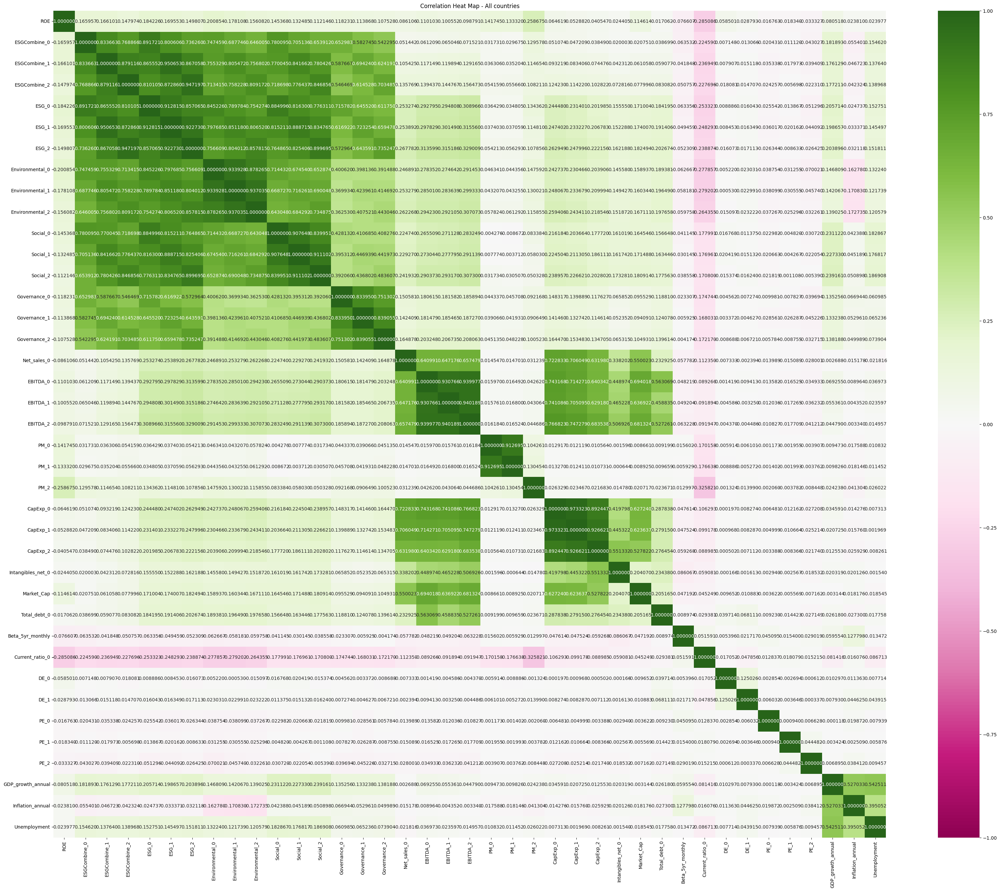

In [ ]:
# @title Features correlation matrix

import pandas as pd
import numpy as np
import seaborn as sn
import matplotlib.pyplot as plt

# Define functions for plotting heat map of correlation matrix
def corr_heatmap(df,colortone,titlestring):
  corr_matrix = pd.DataFrame.corr(df)
  vmax = np.max(np.abs(corr_matrix))
  plt.figure(figsize=(40, 32))
  sn.heatmap(corr_matrix, annot=True,
            cmap=colortone, vmin=-vmax, vmax=vmax,
            cbar_kws={'orientation': 'vertical', 'shrink': 1.0},
            fmt='f')
  return plt.title(titlestring)

# Apply the functions to all countries
corr_heatmap(Features_df,'PiYG','Correlation Heat Map - All countries')

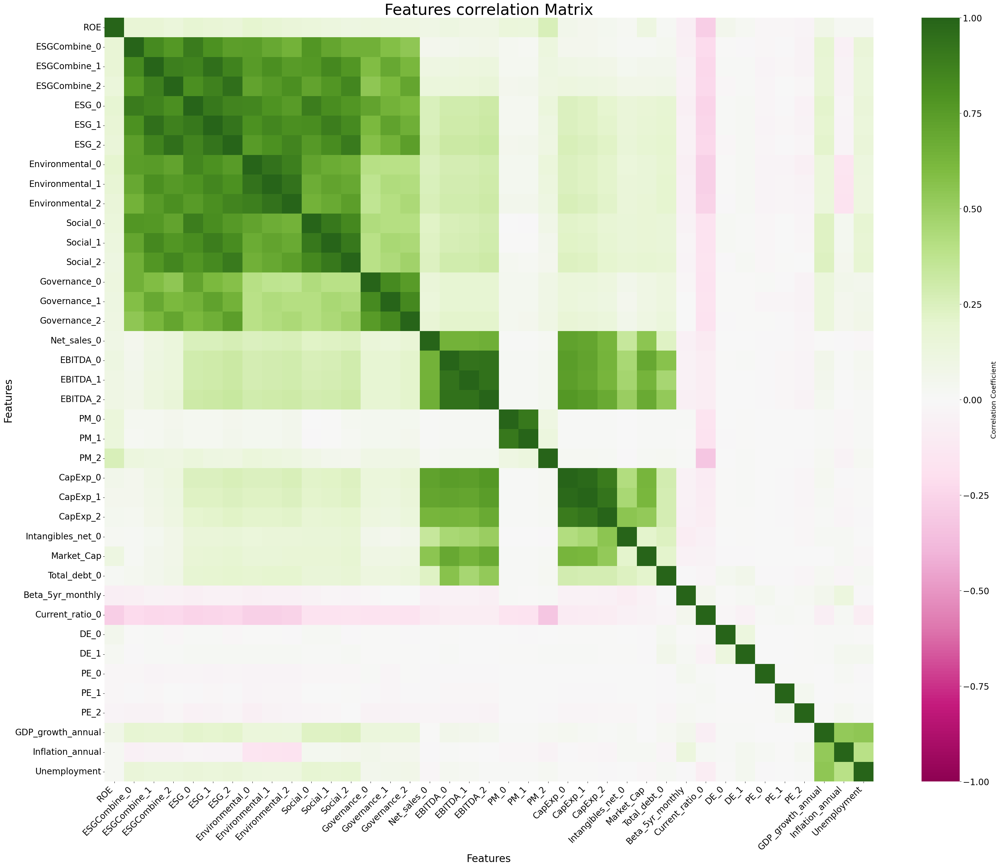

In [ ]:
# Alternate version of correlation matrix with adjustable font size

def corr_heatmap(df, colortone, titlestring,
                 title_fontsize=36,
                 xlabel_fontsize=24,
                 ylabel_fontsize=24,
                 ticklabel_fontsize=20,
                 colorbar_label_fontsize=16,
                 colorbar_ticklabel_fontsize=20):
    # Create correlation matrix
    corr_matrix = pd.DataFrame.corr(df)

    # Find max absolute correlation for symmetric color scaling
    vmax = np.max(np.abs(corr_matrix))

    # Create figure with specified size
    plt.figure(figsize=(40, 32))

    # Create heatmap with enhanced text sizing
    heatmap = sn.heatmap(corr_matrix,
               annot=False,
               cmap=colortone,
               vmin=-vmax,
               vmax=vmax,
               cbar_kws={
                   'orientation': 'vertical',
                   'shrink': 1.0,
                   'label': 'Correlation Coefficient'
               }
               )

    # Customize colorbar
    cbar = heatmap.collections[0].colorbar

    # Set colorbar label font size
    cbar.ax.get_yaxis().label.set_fontsize(colorbar_label_fontsize)

    # Set colorbar tick label size
    cbar.ax.tick_params(labelsize=colorbar_ticklabel_fontsize)

    # Set title with specified font size
    plt.title(titlestring, fontsize=title_fontsize)

    # Adjust x and y axis label font sizes
    plt.xlabel(df.columns.name or 'Features', fontsize=xlabel_fontsize)
    plt.ylabel(df.columns.name or 'Features', fontsize=ylabel_fontsize)

    # Adjust tick label font sizes
    plt.xticks(fontsize=ticklabel_fontsize, rotation=45, ha='right')
    plt.yticks(fontsize=ticklabel_fontsize, rotation=0)

    return plt

# Apply the functions to all countries
corr_heatmap(Features_df,'PiYG','Features correlation Matrix').savefig('Correlation Matrix.png', dpi=300, bbox_inches='tight')

Descriptive analysis for correlations

1.   ESG Combined vs individual (E,S,G) Pillars: All pillars demonstrates
semi-strong to strong positive relations. Governance pillar is relatively weak compared to that of E and S
2.   For each pillar score, prior year and year before last year have decreasing strength of correlation
3.   Country inflation is moderately negative related to Environmental Score
4.   Current ration of company is (surprisingly) negatively related to ESG score combined and individually for all pillars score.
5.   Net sales strongly positively correlated to EBITDA and Capital Expenditure. And moderately positively correlated to ESG scores (individual pillars)









In [ ]:
# Differentiate emerging and developed countries
developed_countries=['Japan','Sweden','United Kingdom','United States',
                     'Norway','Finland','France','Ireland; Republic of',
                     'Switzerland','Spain','Germany','Netherlands',
                     'Denmark','Italy','Belgium']

emerging_countries=['Brazil','Mexico','Chile','Portugal','Greece',
                    'Hungary','Austria','Poland','Turkey','Argentina',
                    'Czech Republic']

Text(0.5, 1.0, 'Correlation Heat Map - Emerging countries')

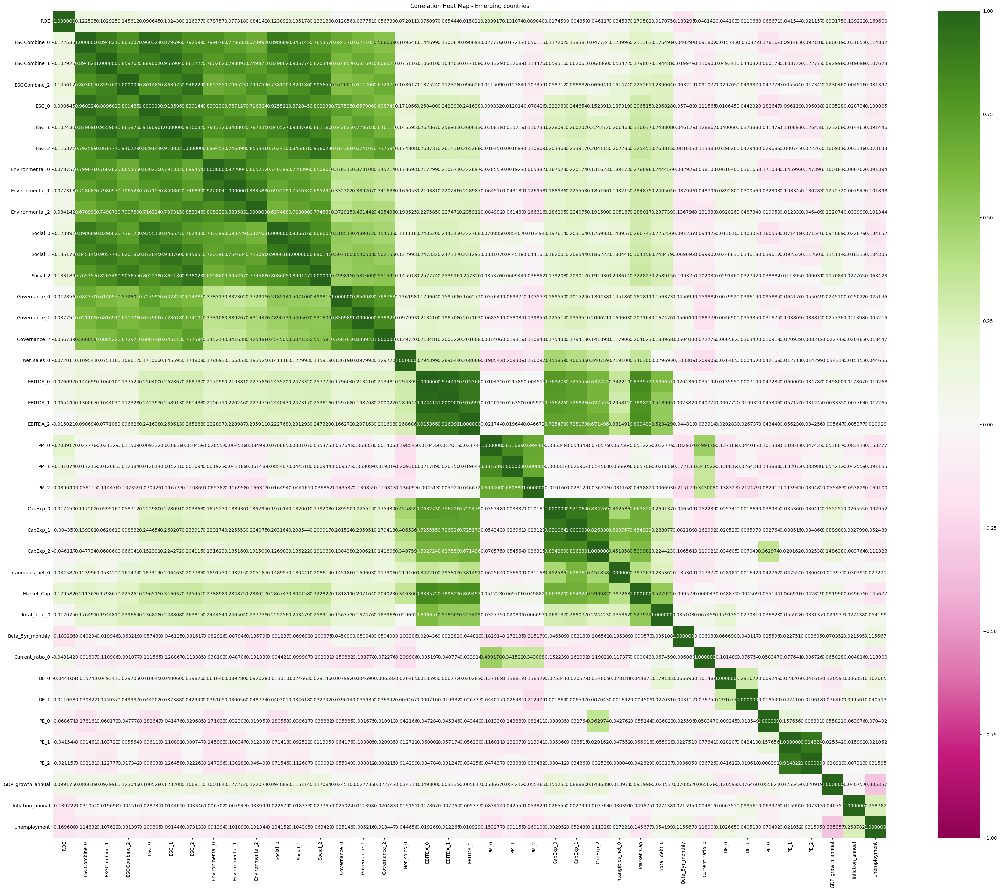

In [ ]:
# Get the dataframe with emerging countries only
emerging_df = ALL_LGSE_R[ALL_LGSE_R['Country of Exchange'].isin(emerging_countries)]
Features_df_e = emerging_df[features]

# Heat map for correlation of emerging countries
corr_heatmap(Features_df_e,'PiYG','Correlation Heat Map - Emerging countries')

Emerging market companies count = 236 out of 3664 (6.44% of sample)

Text(0.5, 1.0, 'Correlation Heat Map - Developed countries')

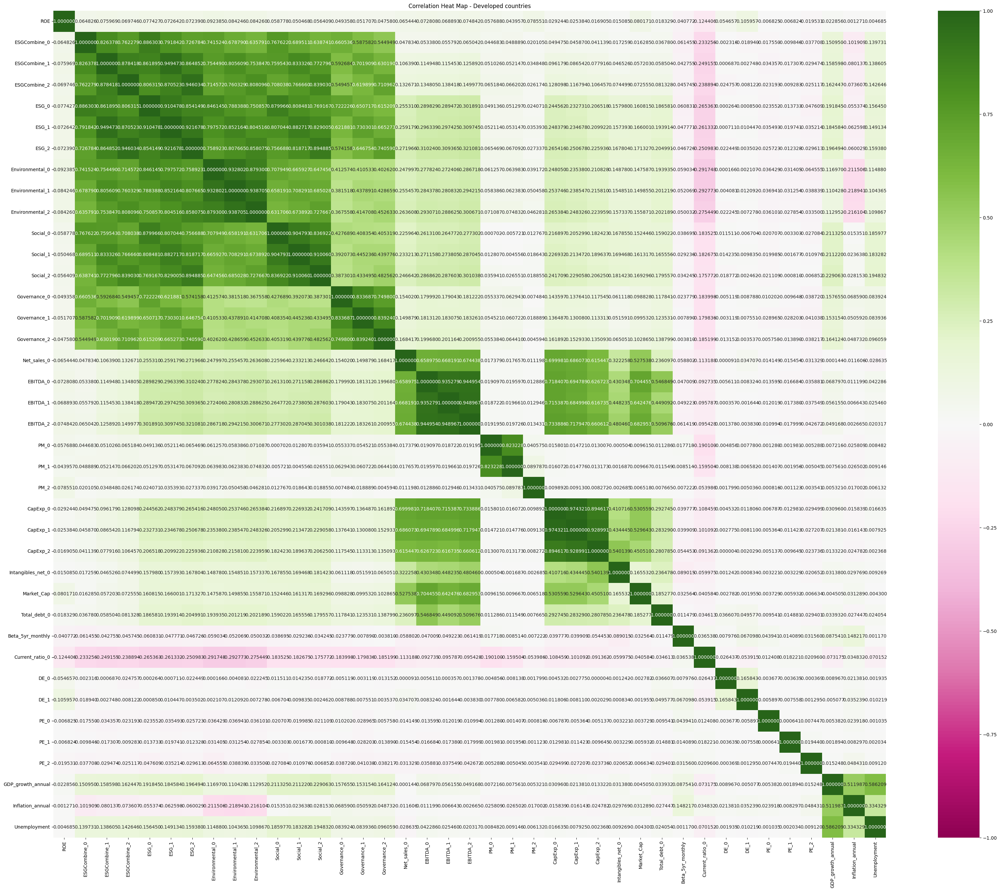

In [ ]:
# Get the dataframe with developed countries only
developed_df = ALL_LGSE_R[ALL_LGSE_R['Country of Exchange'].isin(developed_countries)]
Features_df_d = developed_df[features]

# Heatmaps for correlation matrix for developed countries
corr_heatmap(Features_df_d,'PiYG','Correlation Heat Map - Developed countries')

Developed market companies count = 3428 out of 3664 (93.56% of sample)

In [ ]:
ALL_LGSE_R.to_excel('All ESG variables v0.xlsx', sheet_name='ESG variables')

In [ ]:
# @title Association: ESG Score vs Industries

# Define a function to convert ESG Score into scales

def ESGScore_to_grade(score):
    if score >= 75:
        return 'A'
    elif score >= 50:
        return 'B'
    elif score >= 25:
        return 'C'
    else:
        return 'D'

In [ ]:
# Apply the function to new ALL_LGSE_R to create a new grade column
ALL_LGSE_R['ESG_Grade_0']=ALL_LGSE_R['ESGCombine_0'].apply(ESGScore_to_grade)

<ipython-input-77-2f7c54170efc>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ALL_LGSE_R['ESG_Grade_0']=ALL_LGSE_R['ESGCombine_0'].apply(ESGScore_to_grade)


In [ ]:
# Create a contingency table
contingency_table = pd.crosstab(ALL_LGSE_R['GICS Industry Name'], ALL_LGSE_R['ESG_Grade_0'])

# Convert table to csv
contingency_table.to_csv('chi-sq_ContinTable.csv')

contingency_table

ESG_Grade_0,A,B,C,D
GICS Industry Name,,,,
Aerospace & Defense,1,26,19,3
Air Freight & Logistics,2,8,9,0
Automobile Components,4,29,12,4
Automobiles,3,11,10,2
Banks,20,77,110,20
...,...,...,...,...
Tobacco,2,3,1,1
Trading Companies & Distributors,2,26,23,5
Transportation Infrastructure,2,7,4,2


In [ ]:
from scipy.stats import chi2_contingency

# Step 3: Perform chi-square test
chi2, p_value, dof, expected = chi2_contingency(contingency_table)

# Step 4: Print results
print("Chi-square statistic:", chi2)
print("p-value:", p_value)
print("Degrees of freedom:", dof)
print("\nContingency table:")
print(contingency_table)
print("\nExpected frequencies:")
print(pd.DataFrame(expected, index=contingency_table.index, columns=contingency_table.columns))

Chi-square statistic: 542.4358714550683
p-value: 2.0249878775658232e-29
Degrees of freedom: 219

Contingency table:
ESG_Grade_0                           A   B    C   D
GICS Industry Name                                  
Aerospace & Defense                   1  26   19   3
Air Freight & Logistics               2   8    9   0
Automobile Components                 4  29   12   4
Automobiles                           3  11   10   2
Banks                                20  77  110  20
...                                  ..  ..  ...  ..
Tobacco                               2   3    1   1
Trading Companies & Distributors      2  26   23   5
Transportation Infrastructure         2   7    4   2
Water Utilities                       2   7    4   2
Wireless Telecommunication Services   3   7    3   3

[74 rows x 4 columns]

Expected frequencies:
ESG_Grade_0                                  A          B          C  \
GICS Industry Name                                                     
Aeros

In [ ]:
# Step 5: Interpret the results
alpha = 0.05  # significance level
if p_value <= alpha:
    print(f"\nReject the null hypothesis (p-value: {p_value:.4f} <= {alpha})")
    print("There is a significant association between variables GICs Industries and ESG Score")
else:
    print(f"\nFail to reject the null hypothesis (p-value: {p_value:.4f} > {alpha})")
    print("There is no significant association between GICs Industries and ESG Score")


Reject the null hypothesis (p-value: 0.0000 <= 0.05)
There is a significant association between variables GICs Industries and ESG Score


# Feature Engineering on categorial variables

Followed with association of ROE with Industries, ONE-HOT Encoding is applied to the variable transformation.

One-hot encoding converts categorical variables into a series of binary columns. Each category in the original column becomes a new column, and a row with a particular category will have a 1 in the corresponding column and 0 in all other new columns

In [ ]:
# One-hot encode the categorical columns
ALL_LGSE_R100_en = pd.get_dummies(ALL_LGSE_R[Mask_within100], columns=['GICS Industry Name'])

In [ ]:
ALL_LGSE_R100_en.columns

Index(['Identifier (RIC)', 'Company Name',
       'IV Latest Fiscal Year Period End Date', 'ISIN Code',
       'Country of Exchange', 'Country of Headquarters', 'Currency Code',
       'GDP_growth_annual', 'Inflation_annual', 'Unemployment',
       ...
       'GICS Industry Name_Software', 'GICS Industry Name_Specialized REITs',
       'GICS Industry Name_Specialty Retail',
       'GICS Industry Name_Technology Hardware, Storage & Peripherals',
       'GICS Industry Name_Textiles, Apparel & Luxury Goods',
       'GICS Industry Name_Tobacco',
       'GICS Industry Name_Trading Companies & Distributors',
       'GICS Industry Name_Transportation Infrastructure',
       'GICS Industry Name_Water Utilities',
       'GICS Industry Name_Wireless Telecommunication Services'],
      dtype='object', length=122)

In [ ]:
# Create list of GICs industry
industry_list = list(ALL_LGSE_R['GICS Industry Name'].unique())

# Transform the above lists correspond to dummy boolean features for industries
features_GICS_industry=[]
for i in industry_list:
  temp = 'GICS Industry Name_'+i
  features_GICS_industry.append(temp)

In [ ]:
# Differentiate independent variables from output ROE in new list
# Now the features list, consist of industry encoding are used to build models

features_x = features_ESG+features_financials+features_ratios+features_others+features_macro+features_GICS_industry

In [ ]:
# Encoded whole dataset for model building

# With this encoded dataset compared to initial dataset ALL_LGSE
# (1) Removed duplicate companies (Same company with multiple stock codes)
# (2) Removed ROE > 100 and <-100
# (3) Removed missing ROE or ESG Combined Score
# (4) Filled up missing NaN for all numerical columns with average in same industry
# (5) GICS Industry categorial with one-hot encoding performed

ALL_LGSE_R100_en

,Identifier (RIC),Company Name,IV Latest Fiscal Year Period End Date,ISIN Code,Country of Exchange,Country of Headquarters,Currency Code,GDP_growth_annual,Inflation_annual,Unemployment,...,GICS Industry Name_Software,GICS Industry Name_Specialized REITs,GICS Industry Name_Specialty Retail,"GICS Industry Name_Technology Hardware, Storage & Peripherals","GICS Industry Name_Textiles, Apparel & Luxury Goods",GICS Industry Name_Tobacco,GICS Industry Name_Trading Companies & Distributors,GICS Industry Name_Transportation Infrastructure,GICS Industry Name_Water Utilities,GICS Industry Name_Wireless Telecommunication Services
0,1332.T,Nissui Corp,2024-03-31,JP3718800000,Japan,Japan,JPY,0.954737,2.497703,2.60,...,False,False,False,False,False,False,False,False,False,False
1,2001.T,Nippn Corp,2023-03-31,JP3723000000,Japan,Japan,JPY,0.954737,2.497703,2.60,...,False,False,False,False,False,False,False,False,False,False
2,2002.T,Nisshin Seifun Group Inc,2024-03-31,JP3676800000,Japan,Japan,JPY,0.954737,2.497703,2.60,...,False,False,False,False,False,False,False,False,False,False
3,2206.T,Ezaki Glico Co Ltd,2023-12-31,JP3161200005,Japan,Japan,JPY,0.954737,2.497703,2.60,...,False,False,False,False,False,False,False,False,False,False
4,2212.T,Yamazaki Baking Co Ltd,2023-12-31,JP3935600001,Japan,Japan,JPY,0.954737,2.497703,2.60,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3659,RHP.N,Ryman Hospitality Properties Inc,2023-12-31,US78377T1079,United States,United States of America,USD,1.935635,8.002800,3.65,...,False,False,False,False,False,False,False,False,False,False
3660,RLJ.N,RLJ Lodging Trust,2023-12-31,US74965L1017,United States,United States of America,USD,1.935635,8.002800,3.65,...,False,False,False,False,False,False,False,False,False,False
3661,SHO.N,Sunstone Hotel Investors Inc,NaT,US8678921011,United States,United States of America,USD,1.935635,8.002800,3.65,...,False,False,False,False,False,False,False,False,False,False
3662,SVC.OQ,Service Properties Trust,2023-12-31,US81761L1026,United States,United States of America,USD,1.935635,8.002800,3.65,...,False,False,False,False,False,False,False,False,False,False


In [ ]:
# Descriptive statistics of final dataset

ALL_LGSE_R100_en.describe().to_csv('summary_statistics_ALL_LGSE_R100_en.csv')

In [ ]:
# Breakdown of observations in final dataset by industry
industry_count=[]
for i in features_GICS_industry:
  temp = ALL_LGSE_R100_en[i][ALL_LGSE_R100_en[i] == True].shape[0]
  industry_count.append(temp)

industry_count_df = pd.DataFrame({'GICS Industry':features_GICS_industry,
                                  'Count':industry_count})

industry_count_df.to_csv('summary_statstics_industrycount.csv')

industry_count_df

,GICS Industry,Count
0,GICS Industry Name_Food Products,83
1,GICS Industry Name_Trading Companies & Distrib...,55
2,"GICS Industry Name_Oil, Gas & Consumable Fuels",113
3,GICS Industry Name_Construction & Engineering,47
4,GICS Industry Name_Household Durables,61
...,...,...
69,GICS Industry Name_Water Utilities,15
70,GICS Industry Name_Residential REITs,17
71,GICS Industry Name_Energy Equipment & Services,45
72,GICS Industry Name_Specialized REITs,23


In [ ]:
# Breakdown of observations in final dataset by country
country_count=[]
for i in country:
  temp = ALL_LGSE_R100_en[ALL_LGSE_R100_en['Country of Exchange'] == i].shape[0]
  country_count.append(temp)

country_count_df = pd.DataFrame({'Country':country,
                                  'Count':country_count})

country_count_df

,Country,Count
0,Japan,494
1,Germany,88
2,United States,2021
3,Spain,28
4,United Kingdom,151
5,Sweden,169
6,Netherlands,24
7,Switzerland,40
8,Brazil,111
9,Mexico,45


# Prediction with Regression

(1) Original Regression

In [ ]:
# Run linear regression in a function format

def linear_reg(df,cols_list_x,output_column_y):
  from sklearn.linear_model import LinearRegression
  x = df[cols_list_x]
  y = df[output_column_y]

  model = LinearRegression(fit_intercept=False)
  model.fit(x,y)
  df['Predicted_'+str(output_column_y)+'_reg']=model.predict(x)
  return model,x,y

In [ ]:
# @title Model building and coefficient
# Assign LR output as tuple with model, x and y
lr_output = linear_reg(ALL_LGSE_R100_en,features_x,'ROE')

# Get the model coefficient for each variables
feature_coef = lr_output[0].coef_

# Creating a dictionary to map feature names to their corresponding coefficients
feature_coef_dict = dict(zip(features_x, feature_coef))

feature_coef_dict

{'ESGCombine_0': 0.030223766837256878,
 'ESGCombine_1': 0.048995540410887335,
 'ESGCombine_2': 0.08412625883414038,
 'ESG_0': -0.7739767053027383,
 'ESG_1': 0.034592459275923325,
 'ESG_2': 0.3159471499133818,
 'Environmental_0': 0.35657734327723534,
 'Environmental_1': -0.07294440559453264,
 'Environmental_2': -0.1690350919811177,
 'Social_0': 0.3162403520678233,
 'Social_1': 0.05615463851843112,
 'Social_2': -0.20910173861295314,
 'Governance_0': 0.2437866947041246,
 'Governance_1': -0.03189677248100843,
 'Governance_2': -0.12108157464758978,
 'Net_sales_0': 1.0382944504172542e-12,
 'EBITDA_0': 5.134232483605672e-10,
 'EBITDA_1': -1.242017010072427e-10,
 'EBITDA_2': -3.8351877229558795e-11,
 'PM_0': 0.03866215399591042,
 'PM_1': -0.03286204240116833,
 'PM_2': 0.27695428115019777,
 'Current_ratio_0': -0.7411771349854815,
 'DE_0': 0.10850039596222276,
 'DE_1': 0.05364905783298361,
 'PE_0': -0.000385344757438566,
 'PE_1': 0.00019218966681913696,
 'PE_2': -0.0009853804500888907,
 'CapExp_

In [ ]:
# Put the training and testing output in a dataframe
lr_output_df = pd.DataFrame({'ROE':lr_output[2],
                             'ROE_predict':lr_output[0].predict(lr_output[1])
                           })

In [ ]:
lr_output_df

,ROE,ROE_predict
0,10.048628,9.388254
1,12.611039,11.836162
2,7.011633,12.600295
3,6.028821,14.963611
4,9.667057,9.358340
...,...,...
3659,62.453896,10.178922
3660,2.188895,2.588140
3661,3.326520,9.269184
3662,-8.295375,0.592565


<Axes: title={'center': 'Regression Prediction vs Actual ROE'}>

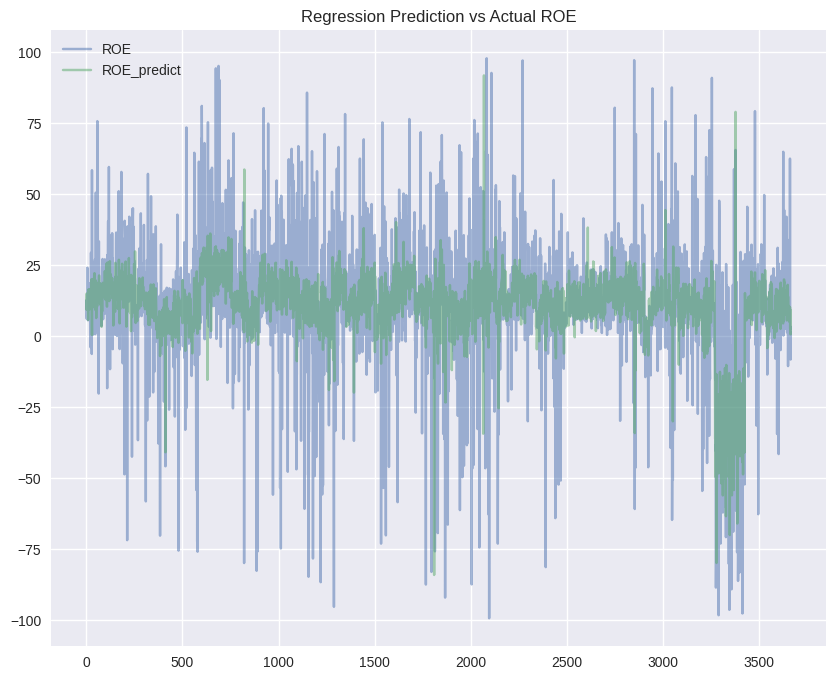

In [ ]:
#Plot the predicted ROE vs Actual ROE
lr_output_df[['ROE','ROE_predict']].sort_index().plot(alpha=0.5,
                                                      title='Regression Prediction vs Actual ROE',
                                                      figsize=(10, 8))

In [ ]:
# @title Model Performance
# Define functions for KPI of Linear Regression Model

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.feature_selection import f_regression
from statsmodels.stats.stattools import durbin_watson
import numpy as np
import pandas as pd

def lr_KPI(dataset_df, cols_list_x, output_column_y, data_text):
    # Run linear regression
    x = dataset_df[cols_list_x]
    y = dataset_df[output_column_y]

    model = LinearRegression(fit_intercept=False)
    model.fit(x, y)

    # Calculate performance metrics
    y_pred = model.predict(x)
    r_squared = model.score(x, y)
    adj_r_squared = 1 - (1 - r_squared) * (len(y) - 1) / (len(y) - len(cols_list_x) - 1)
    bic = len(y) * np.log(mean_squared_error(y, y_pred)) + len(cols_list_x) * np.log(len(y))
    residuals = y - y_pred

    # f_regression to return the F-statistic and p-value for each individual feature in the input
    anova_f_stat, anova_p_value = f_regression(x, y)
    anova_f_stat = anova_f_stat[0] #select only the overall F-Statistic
    anova_p_value = anova_p_value[0] #select only the overall p-value

    # Calculate Durbin-Watson statistic
    dw_statistic = durbin_watson(residuals)

    # Calculate additional performance metrics
    mse = mean_squared_error(y, y_pred)
    mae = mean_absolute_error(y, y_pred)
    rmse = np.sqrt(mean_squared_error(y, y_pred))

    # Put all performance indicators into a dataframe
    model_performance = pd.DataFrame({
        "Dataset": data_text,
        "R_squared": [r_squared],
        "Adjusted R_squared": [adj_r_squared],
        "MSE": [mse],
        "MAE": [mae],
        "RMSE": [rmse],
        "BIC": [bic],
        "ANOVA F_statistic": [anova_f_stat],
        "ANOVA p_value": [anova_p_value],
        "DW-Test":[dw_statistic]
    })

    return model_performance

In [ ]:
lr_KPI(ALL_LGSE_R100_en,features_x,'ROE','All companies')

,Dataset,R_squared,Adjusted R_squared,MSE,MAE,RMSE,BIC,ANOVA F_statistic,ANOVA p_value,DW-Test
0,All companies,0.270258,0.24622,330.750064,11.558084,18.186535,21294.581476,99.437646,4.096793e-23,1.901775


(2) Features selection

(i) Backward Selection

In [ ]:

# @title Feature Selection
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import f_regression

def backward_selection(model, X, y, significance_level=0.05):
    features = list(X.columns)
    n_features = len(features)
    n_samples = len(y)

    def calculate_adjusted_r_squared(y_true, y_pred, n_samples, n_features):
        sse = np.sum((y_true - y_pred) ** 2)
        sst = np.sum((y_true - np.mean(y_true)) ** 2)
        r_squared = 1 - (sse / sst)
        adjusted_r_squared = 1 - (1 - r_squared) * (n_samples - 1) / (n_samples - n_features - 1)
        return adjusted_r_squared

    while len(features) > 0:
        # Fit the model with current features
        model = LinearRegression(fit_intercept=False)
        model.fit(X[features], y)

        # Calculate p-values for each feature
        _, p_values = f_regression(X[features], y)

        # Find the feature with the highest p-value
        max_p_value = max(p_values)

        if max_p_value > significance_level:
            # Remove the feature with the highest p-value
            exclude_feature = features[p_values.argmax()]
            features.remove(exclude_feature)
            print(f"Removed feature: {exclude_feature} (p-value: {max_p_value:.4f})")
        else:
            # Stop if all remaining features are significant
            break

    # Final model with selected features
    final_model = LinearRegression(fit_intercept=False)
    final_model.fit(X[features], y)

    # Calculate adjusted R-squared for the final model
    y_pred = final_model.predict(X[features])
    adjusted_r_squared = calculate_adjusted_r_squared(y, y_pred, n_samples, len(features))

    print("\nBackward Selection completed.")
    print(f"Selected features: {features}")
    print(f"Final model Adjusted R-squared: {adjusted_r_squared:.4f}")

    return final_model, features

# Usage example:
# model, X, y = linear_reg(df, cols_list_x, output_column_y)
# final_model, selected_features = backward_selection(model, X, y)

In [ ]:
# Perform backward selection on LR

model, X, y = lr_output
lr_final_model_bs, lr_selected_features_bs = backward_selection(model, X, y)


Removed feature: GICS Industry Name_Household Durables (p-value: 0.9778)
Removed feature: GICS Industry Name_Specialized REITs (p-value: 0.9496)
Removed feature: GICS Industry Name_Consumer Finance (p-value: 0.8933)
Removed feature: GICS Industry Name_Paper & Forest Products (p-value: 0.8857)
Removed feature: GICS Industry Name_Water Utilities (p-value: 0.8695)
Removed feature: GICS Industry Name_Gas Utilities (p-value: 0.8470)
Removed feature: GICS Industry Name_Banks (p-value: 0.8447)
Removed feature: GICS Industry Name_Hotels, Restaurants & Leisure (p-value: 0.8191)
Removed feature: GICS Industry Name_Energy Equipment & Services (p-value: 0.7400)
Removed feature: GICS Industry Name_Interactive Media & Services (p-value: 0.7325)
Removed feature: GICS Industry Name_Independent Power and Renewable Electricity Producers (p-value: 0.7256)
Removed feature: GICS Industry Name_Passenger Airlines (p-value: 0.7213)
Removed feature: GICS Industry Name_Automobile Components (p-value: 0.7205)
Re

In [ ]:
# Model performance with new selected features using backward selection

lr_KPI(ALL_LGSE_R100_en,lr_selected_features_bs,'ROE','All companies with selected features (backward)')

,Dataset,R_squared,Adjusted R_squared,MSE,MAE,RMSE,BIC,ANOVA F_statistic,ANOVA p_value,DW-Test
0,All companies with selected features (backward),0.242666,0.232172,343.256058,11.938719,18.527171,20902.451455,99.437646,4.096793e-23,1.877243


(ii) Forward Selection

In [ ]:
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import f_regression

def forward_selection(model, X, y, significance_level=0.05):
    features = list(X.columns)
    n_samples = len(y)
    selected_features = []

    def calculate_adjusted_r_squared(y_true, y_pred, n_samples, n_features):
        sse = np.sum((y_true - y_pred) ** 2)
        sst = np.sum((y_true - np.mean(y_true)) ** 2)
        r_squared = 1 - (sse / sst)
        adjusted_r_squared = 1 - (1 - r_squared) * (n_samples - 1) / (n_samples - n_features - 1)
        return adjusted_r_squared

    while len(features) > 0:
        best_feature = None
        best_p_value = 1
        best_adjusted_r_squared = -np.inf

        for feature in features:
            temp_features = selected_features + [feature]
            X_temp = X[temp_features]

            # Fit the model with current features
            temp_model = LinearRegression(fit_intercept=False)
            temp_model.fit(X_temp, y)

            # Calculate p-value for the new feature
            _, p_values = f_regression(X_temp, y)
            p_value = p_values[-1]  # p-value of the newly added feature

            # Calculate adjusted R-squared
            y_pred = temp_model.predict(X_temp)
            adjusted_r_squared = calculate_adjusted_r_squared(y, y_pred, n_samples, len(temp_features))

            if p_value < significance_level and adjusted_r_squared > best_adjusted_r_squared:
                best_feature = feature
                best_p_value = p_value
                best_adjusted_r_squared = adjusted_r_squared

        if best_feature is not None:
            selected_features.append(best_feature)
            features.remove(best_feature)
            print(f"Added feature: {best_feature} (p-value: {best_p_value:.4f}, Adjusted R-squared: {best_adjusted_r_squared:.4f})")
        else:
            # Stop if no feature meets the criteria
            break

    # Final model with selected features
    final_model = LinearRegression(fit_intercept=False)
    final_model.fit(X[selected_features], y)

    # Calculate final adjusted R-squared
    y_pred = final_model.predict(X[selected_features])
    final_adjusted_r_squared = calculate_adjusted_r_squared(y, y_pred, n_samples, len(selected_features))

    print("\nForward Selection completed.")
    print(f"Selected features: {selected_features}")
    print(f"Final model Adjusted R-squared: {final_adjusted_r_squared:.4f}")

    return final_model, selected_features

# Usage example:
# model, X, y = linear_reg(df, cols_list_x, output_column_y)
# final_model, selected_features = forward_selection(model, X, y)

In [ ]:
# Assign LR output as tuple with model, x and y
lr_output = linear_reg(ALL_LGSE_R100_en,features_x,'ROE')

# Perform forward selection on LR
model, X, y = lr_output
lr_final_model_fs, lr_selected_features_fs = forward_selection(model, X, y)

Added feature: ESG_0 (p-value: 0.0000, Adjusted R-squared: 0.0336)
Added feature: GICS Industry Name_Biotechnology (p-value: 0.0000, Adjusted R-squared: 0.1441)
Added feature: PM_2 (p-value: 0.0000, Adjusted R-squared: 0.1571)
Added feature: GICS Industry Name_Capital Markets (p-value: 0.0000, Adjusted R-squared: 0.1645)
Added feature: DE_0 (p-value: 0.0005, Adjusted R-squared: 0.1719)
Added feature: GDP_growth_annual (p-value: 0.0000, Adjusted R-squared: 0.1778)
Added feature: Market_Cap (p-value: 0.0000, Adjusted R-squared: 0.1845)
Added feature: GICS Industry Name_Professional Services (p-value: 0.0000, Adjusted R-squared: 0.1896)
Added feature: Current_ratio_0 (p-value: 0.0000, Adjusted R-squared: 0.1934)
Added feature: CapExp_1 (p-value: 0.0017, Adjusted R-squared: 0.1966)
Added feature: GICS Industry Name_Office REITs (p-value: 0.0028, Adjusted R-squared: 0.1997)
Added feature: PM_0 (p-value: 0.0000, Adjusted R-squared: 0.2025)
Added feature: GICS Industry Name_Real Estate Manage

In [ ]:
# Model performance with new selected features using backward selection

lr_KPI(ALL_LGSE_R100_en,lr_selected_features_fs,'ROE','All companies with selected features (forward)')

,Dataset,R_squared,Adjusted R_squared,MSE,MAE,RMSE,BIC,ANOVA F_statistic,ANOVA p_value,DW-Test
0,All companies with selected features (forward),0.242666,0.232172,343.256048,11.938481,18.527171,20902.451351,123.346577,3.433794e-28,1.877241


(3) Multicollinearity Cure

In [ ]:
# @title Multicollinearity Cure
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression

def calculate_vif(model, X, y):
    """
    Calculate the Variance Inflation Factor (VIF) for each feature in the model.

    Parameters:
    model (LinearRegression): The fitted linear regression model
    X (pd.DataFrame): The input features DataFrame
    y (pd.Series): The target variable

    Returns:
    pd.DataFrame: A DataFrame containing the VIF for each feature
    """
    # Get feature names
    features = X.columns

    # Initialize a DataFrame to store VIF values
    vif_data = pd.DataFrame()
    vif_data["Feature"] = features

    # Calculate VIF for each feature
    vif_values = []
    for i in range(len(features)):
        # Select all features except the current one
        other_features = [f for f in features if f != features[i]]

        # Fit a linear regression model
        X_other = X[other_features]
        y_i = X[features[i]]
        model_vif = LinearRegression(fit_intercept=False)
        model_vif.fit(X_other, y_i)

        # Calculate R-squared
        y_pred = model_vif.predict(X_other)
        r_squared = 1 - (np.sum((y_i - y_pred) ** 2) / np.sum((y_i - np.mean(y_i)) ** 2))

        # Calculate VIF
        vif = 1 / (1 - r_squared)
        vif_values.append(vif)

    vif_data["VIF"] = vif_values

    # Sort by VIF value in descending order
    vif_data = vif_data.sort_values("VIF", ascending=False).reset_index(drop=True)

    return vif_data

# Usage example:
# model, X, y = linear_reg(df, cols_list_x, output_column_y)
# vif_results = calculate_vif(model, X, y)
# print(vif_results)

In [ ]:
# Assign LR output as tuple with model, x and y
lr_output = linear_reg(ALL_LGSE_R100_en,lr_selected_features_bs,'ROE')

# Perform forward selection on LR
model, X, y = lr_output

# Calculate VIF
vif_results = calculate_vif(model, X, y)
print(vif_results)

                                              Feature         VIF
0                                               ESG_1  526.061017
1                                               ESG_2  347.488802
2                                               ESG_0  318.084012
3                                            Social_1  119.427223
4                                     Environmental_1   91.487786
5                                            Social_2   75.967789
6                                            Social_0   74.495224
7                                        Governance_1   73.093449
8                                     Environmental_2   58.721207
9                                     Environmental_0   52.291725
10                                       Governance_0   48.530858
11                                       Governance_2   44.381072
12                                           CapExp_1   29.203256
13                                           CapExp_0   22.482038
14        

In [ ]:
# Cure multicollinearity by droping features with VIF>10 one-by-one

X1 = X.drop(columns=['ESG_1','ESG_2','ESG_0','CapExp_1','Environmental_1','Social_1',
                     'ESGCombine_2','EBITDA_2'])

# Calculate VIF
vif_results = calculate_vif(model, X1, y)
print(vif_results)

                                              Feature       VIF
0                                        ESGCombine_1  9.443989
1                                            EBITDA_0  9.117342
2                                            EBITDA_1  8.400922
3                                            CapExp_0  7.852134
4                                     Environmental_0  7.488851
5                                        Governance_1  7.376610
6                                     Environmental_2  7.354386
7                                        ESGCombine_0  6.668502
8                                            Social_0  6.634944
9                                            Social_2  6.360546
10                                               PM_1  6.065352
11                                               PM_0  6.014439
12                                           CapExp_2  5.098630
13                                       Governance_0  4.766121
14                                      

In [ ]:
# Run the regression KPI for multicollinearity cured

# Put selected features into a list
# Only features with significant p-value and VIF<10 remained
features_x_bs_no_mc = list(X1.columns)

lr_KPI(ALL_LGSE_R100_en,features_x_bs_no_mc,'ROE','All companies with feature selected (backwards)')

,Dataset,R_squared,Adjusted R_squared,MSE,MAE,RMSE,BIC,ANOVA F_statistic,ANOVA p_value,DW-Test
0,All companies with feature selected (backwards),0.237796,0.229015,345.463254,11.930725,18.586642,20859.654537,99.437646,4.096793e-23,1.880231


(4) Excluding Outliers

In [ ]:
# @title Outlier Detection
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

def plot_standardized_residuals(model_output, std_x_scale=3.0,std_y_scale=3.0):
      # Predict using the model
      y_pred = model_output[0].predict(model_output[1])

      # Calculate residuals
      residuals = model_output[2] - y_pred

      # Standardize residuals
      standardized_residuals = (residuals - np.mean(residuals)) / np.std(residuals)

      # Standardize predicted values
      standardized_y_pred = (y_pred - np.mean(y_pred)) / np.std(y_pred)

      # Create the plot
      plt.figure(figsize=(10, 6))
      plt.scatter(standardized_y_pred, standardized_residuals, alpha=0.5)
      plt.xlabel('Standardized Predicted Values')
      plt.ylabel('Standardized Residuals')
      plt.title('Standardized Residuals vs Standardized Predicted Values')

      # Add a horizontal line at y=0
      plt.axhline(y=0, color='r', linestyle='--')

      # Set x and y axis limits based on the specified standard deviation scale
      plt.xlim(-std_x_scale, std_x_scale)
      plt.ylim(-std_y_scale, std_y_scale)

      # Improve the plot layout
      plt.tight_layout()
      plt.show()

      return plt,standardized_residuals,standardized_y_pred

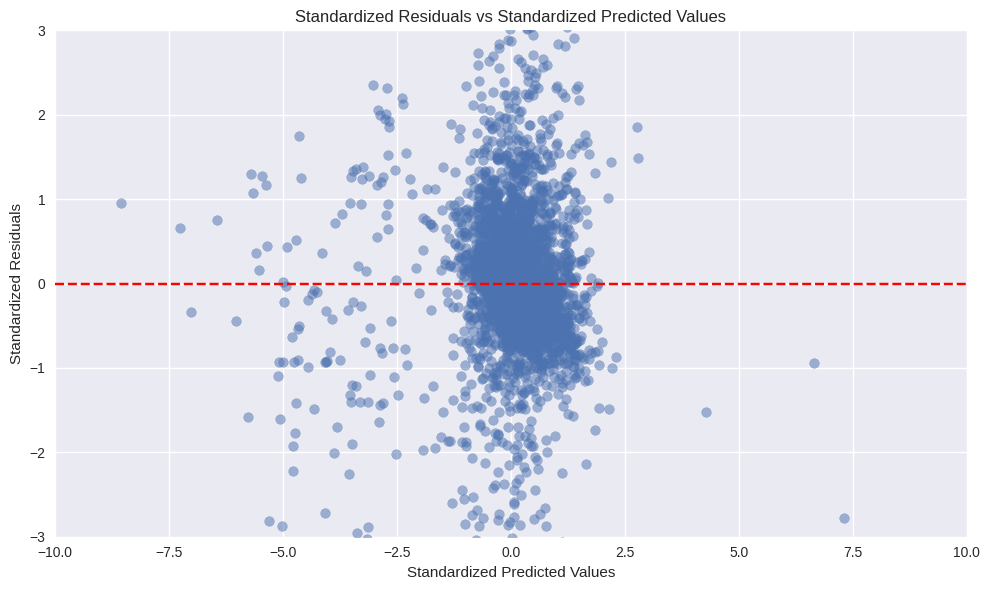

In [ ]:
# Rin the regression again with selected features and cured multicollinearity

# Assign LR output as tuple with model, x and y
lr_output = linear_reg(ALL_LGSE_R100_en,features_x_bs_no_mc,'ROE')

# Lets see the standardized residual plot
plot,residual_sx,residual_sy = plot_standardized_residuals(lr_output, std_x_scale=10.0,std_y_scale=3.0)


# Prediction with Regression (Final)

Following occurence of outliers, those standardized residuals with more than +/- 3.0 are removed. Linear regression is built again

(0) Preprocessing

In [ ]:
# Create new dataframe for regression with residual standardized values of original regression and predicted values
ALL_LGSE_Rn = ALL_LGSE_R100_en

ALL_LGSE_Rn['Std_prediction'] = residual_sy
ALL_LGSE_Rn['Std_residuals'] = residual_sx

In [ ]:
# Assign masks for outliers exclusion
# Mask 1
Mask_no_OLI = (ALL_LGSE_Rn['Std_residuals'] > -3.0) & (ALL_LGSE_Rn['Std_residuals'] < 3.0)
# Mask 2
Mask_no_OLI_2 = (ALL_LGSE_Rn['Std_residuals'] > -3.0) & (ALL_LGSE_Rn['Std_residuals'] < 3.0) & (ALL_LGSE_Rn['Std_prediction'] > -2.5)

In [ ]:
ALL_LGSE_Rn[Mask_no_OLI].shape[0]

3422

In [ ]:
# Look at data where outliers on left side
ALL_LGSE_Rn[Mask_no_OLI][ALL_LGSE_Rn['Std_prediction']<-2.5][['Identifier (RIC)','Country of Exchange','ROE','Predicted_ROE_reg','Std_prediction','Std_residuals']]

<ipython-input-85-74786267759f>:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  ALL_LGSE_Rn[Mask_no_OLI][ALL_LGSE_Rn['Std_prediction']<-2.5][['Identifier (RIC)','Country of Exchange','ROE','Predicted_ROE_reg','Std_prediction','Std_residuals']]


,Identifier (RIC),Country of Exchange,ROE,Predicted_ROE_reg,Std_prediction,Std_residuals
412,OPEN.OQ,United States,-45.871145,-29.529513,-3.742073,-0.900923
1290,VGR.N,United States,-25.311883,-17.523164,-2.630368,-0.440652
1392,QS.N,United States,-36.914386,-16.785197,-2.562037,-1.104748
1868,TERN.OQ,United States,-31.040787,-17.162119,-2.596938,-0.768380
2144,IONQ.N,United States,-34.706918,-19.744440,-2.836043,-0.826704
...,...,...,...,...,...,...
3419,VYGR.OQ,United States,-1.221657,-26.497131,-3.461296,1.338682
3420,XNCR.OQ,United States,-20.270820,-23.441251,-3.178342,0.149110
3421,YMAB.OQ,United States,-21.012636,-25.276496,-3.348273,0.207952
3422,ZELA.CO,Denmark,-45.310777,-19.320001,-2.796743,-1.420187


(1) Regression

In [ ]:
# Assign LR output as tuple with model, x and y
lr_output = linear_reg(ALL_LGSE_Rn[Mask_no_OLI], features_x_bs_no_mc, 'ROE')

# Get the model, x, and y from the output
model, X, y = lr_output

# Get the model coefficient for each variable
feature_coef = model.coef_

# Calculate standardized coefficients
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
std_coef = feature_coef * scaler.scale_

# Create a DataFrame with the results
results_df = pd.DataFrame({
    'Feature': features_x_bs_no_mc,
    'Coefficient': feature_coef,
    'Standardized Coefficient': std_coef
})

# Sort the DataFrame by absolute standardized coefficient values
results_df['Abs_Std_Coef'] = np.abs(results_df['Standardized Coefficient'])
results_df = results_df.sort_values('Abs_Std_Coef', ascending=False).drop('Abs_Std_Coef', axis=1)

# Reset the index for clean display
results_df = results_df.reset_index(drop=True)

# Display the results
print(results_df.round(4).to_string(index=False))

                                                    Feature  Coefficient  Standardized Coefficient
                           GICS Industry Name_Biotechnology     -28.8489                   -5.0885
                                                       PM_2       0.4863                    3.2281
                                                       PM_0       0.0401                    2.5842
                                            Environmental_2      -0.0887                   -2.5592
                                               ESGCombine_1       0.1275                    2.3742
                                                 Market_Cap       0.0000                    2.1804
                                          GDP_growth_annual       2.0631                    1.8946
                                                       DE_0       0.1113                    1.7024
                         GICS Industry Name_Capital Markets      10.5363                    1.6952
          

<ipython-input-63-09e5a310c748>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Predicted_'+str(output_column_y)+'_reg']=model.predict(x)


In [ ]:
results_df.to_csv("lr_model_coefficient.csv")

In [ ]:
# Put the training and testing output in a dataframe
lr_output_df = pd.DataFrame({'ROE':lr_output[2],
                             'ROE_predict':lr_output[0].predict(lr_output[1])
                           })

In [ ]:
lr_output_df

,ROE,ROE_predict
0,10.048628,7.191836
1,12.611039,7.001491
2,7.011633,10.584888
3,6.028821,13.161851
4,9.667057,3.013904
...,...,...
3659,62.453896,12.800410
3660,2.188895,5.954985
3661,3.326520,10.749066
3662,-8.295375,3.507674


<Axes: title={'center': 'Regression Prediction vs Actual ROE'}>

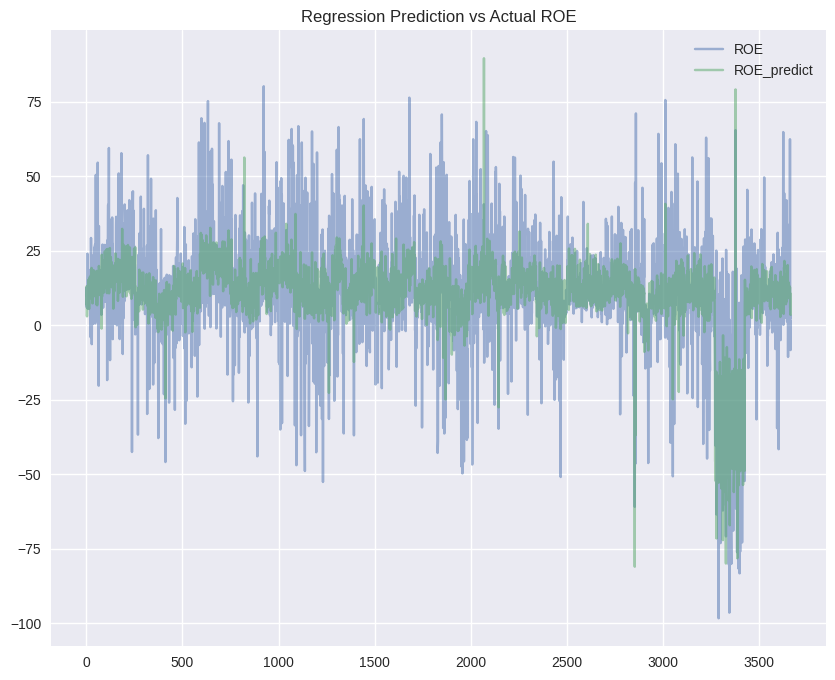

In [ ]:
#Plot the predicted ROE vs Actual ROE
lr_output_df[['ROE','ROE_predict']].sort_index().plot(alpha=0.5,
                                                      title='Regression Prediction vs Actual ROE',
                                                      figsize=(10, 8))

In [ ]:
lr_KPI(ALL_LGSE_Rn[Mask_no_OLI],features_x_bs_no_mc,'ROE','All companies(No OLI)')

,Dataset,R_squared,Adjusted R_squared,MSE,MAE,RMSE,BIC,ANOVA F_statistic,ANOVA p_value,DW-Test
0,All companies(No OLI),0.330614,0.322695,210.46389,10.234285,14.507374,18630.872043,96.265067,1.981067e-22,1.892117


In [ ]:
# Count of sample companies after OLI exclusion

ALL_LGSE_Rn[Mask_no_OLI].shape[0]

3422

(2) Reponse Transformation

In [ ]:
# Prepare new df for natural log transformation

ALL_LGSE_Rn_tr = ALL_LGSE_Rn

ALL_LGSE_Rn_tr['ln_ROE'] = np.log10(ALL_LGSE_Rn_tr['ROE']+100)

ALL_LGSE_Rn_tr['ln_ROE']

,ln_ROE
0,2.041585
1,2.051581
2,2.029431
3,2.025424
4,2.040076
...,...
3659,2.210730
3660,2.009404
3661,2.014212
3662,1.962391


In [ ]:
# Assign LR output as tuple with model, x and y
#lr_output = linear_reg(ALL_LGSE_Rn_tr[Mask_no_OLI], features_x_bs_no_mc, 'ln_ROE')

In [ ]:
#lr_KPI(ALL_LGSE_Rn_tr[Mask_no_OLI],features_x_bs_no_mc,'ln_ROE','All companies(No OLI)')

(3) Multicolinearity cure check

In [ ]:
# Perform forward selection on LR without outliers
model, X, y = lr_output

# Checked again with VIF
vif_results = calculate_vif(model, X, y)
print(vif_results)

                                              Feature       VIF
0                                        ESGCombine_1  9.427774
1                                            EBITDA_0  9.085247
2                                            EBITDA_1  8.381201
3                                            CapExp_0  7.990334
4                                     Environmental_0  7.571506
5                                     Environmental_2  7.402108
6                                        Governance_1  7.311049
7                                        ESGCombine_0  6.659132
8                                            Social_0  6.622572
9                                            Social_2  6.385751
10                                               PM_1  6.129733
11                                               PM_0  6.079950
12                                           CapExp_2  5.138017
13                                       Governance_0  4.788981
14                                      

(4) Residual check

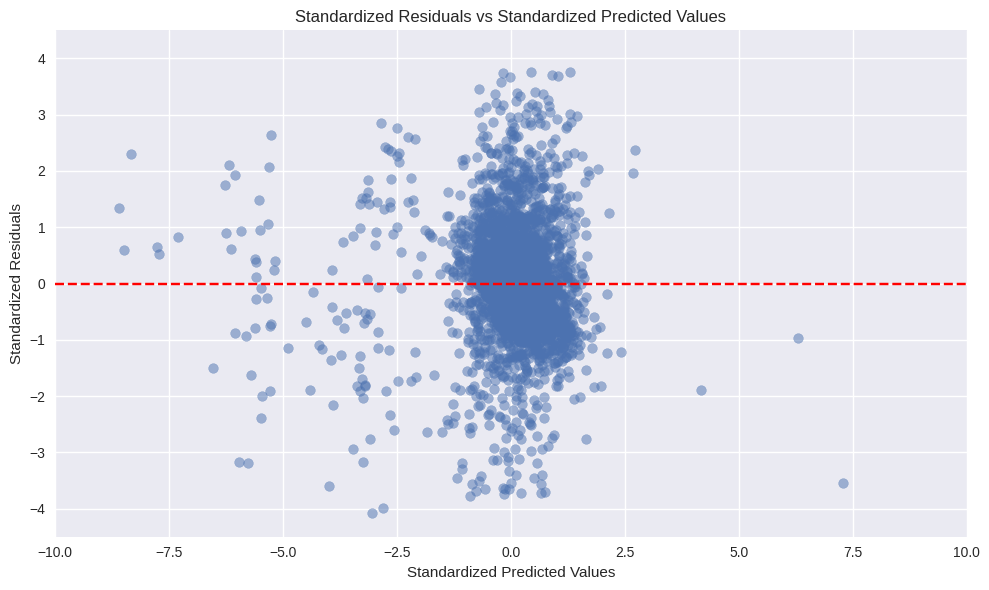

In [ ]:
# Lets see the standardized residual plot
plot,residual_sx,residual_sy = plot_standardized_residuals(lr_output, std_x_scale=10.0, std_y_scale=4.5)

# Prediction with Random Forests (RF)

In [ ]:
#Define similar functions for random forest

def random_forest_reg(df, cols_list_x, output_column_y, tree_no, rs, max_f=None, max_s=None):
    from sklearn.ensemble import RandomForestRegressor
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import r2_score

    x = df[cols_list_x]
    y = df[output_column_y]

    # Scale the input features (optional)
    from sklearn.preprocessing import StandardScaler
    scaler = StandardScaler()

    x = scaler.fit_transform(x)

    # Split the dataset into training and testing
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=rs)

    # Create and train the Random Forest Regressor model
    model = RandomForestRegressor(n_estimators=tree_no, max_features=max_f, max_samples =max_s, random_state=rs)
    model.fit(x_train, y_train)  # Fit the model

    # Training the model and get training performance
    y_train_pred = model.predict(x_train)
    r2_train = r2_score(y_train, y_train_pred)

    # Perform predictions in test
    y_test_pred = model.predict(x_test)
    r2_test = r2_score(y_test, y_test_pred)

    # Put all outputs in a single dictionary
    output = {'Model':model,
              'x_train':x_train,'x_test':x_test,
              'y_train':y_train,'y_test':y_test,'y_train_pred':y_train_pred,'y_test_pred':y_test_pred}

    return output

In [ ]:
ALL_LGSE_R100_en.describe()

NameError: name 'ALL_LGSE_R100_en' is not defined

In [ ]:
# Hyperparameters for RF as number of trees to ensemble
tree_no = 400
# Hyperparameters for RF as seed for random number generator
rs = 42

# Assign multiple ouputs into a single tuple
rf_output = random_forest_reg(ALL_LGSE_R100_en,features_x,'ROE',tree_no,rs)

In [ ]:
# Put the training and testing output in a dataframe
rf_train_df = pd.DataFrame({'ROE_train':rf_output['y_train'],
                            'ROE_train_predict':rf_output['y_train_pred']
                           })

rf_test_df = pd.DataFrame({'ROE_test':rf_output['y_test'],
                           'ROE_test_predict':rf_output['y_test_pred']
                          })

In [ ]:
from sklearn.metrics import r2_score
r2_test = r2_score(rf_output['y_test'], rf_output['y_test_pred'])
r2_train = r2_score(rf_output['y_train'], rf_output['y_train_pred'])
r2_test

Graphical presentation of RF model fit in TESTING dataset

In [ ]:
#Plot the predicted ROE vs Actual ROE in TESTING dataset
rf_test_df[['ROE_test','ROE_test_predict']].sort_index().plot(alpha=0.5,
                                                               title='RF Testing Prediction vs Actual ROE',
                                                               figsize=(10, 8))

Graphical presentation of RF model fit in TRAINING dataset

In [ ]:
#Plot the predicted ROE vs Actual ROE in TRAINING dataset
rf_train_df[['ROE_train','ROE_train_predict']].sort_index().plot(alpha=0.5,
                                                            title='RF Training Prediction vs Actual ROE',
                                                            figsize=(10, 8))

In [ ]:
# Define functions returning RF model performance measures

def random_forest_KPI(df, cols_list_x, output_column_y, tree_no, rs, df_text,max_f=None, max_s=None):
    from sklearn.ensemble import RandomForestRegressor
    from sklearn.model_selection import cross_val_predict
    from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
    import numpy as np

    # Results in tuple from nested function for rf through holdout method
    rf_output = random_forest_reg(df, cols_list_x, output_column_y, tree_no, rs,max_f, max_s)

    # Calculate the KPI metrics for the training dataset
    mse_train = mean_squared_error(rf_output['y_train'], rf_output['y_train_pred'])
    rmse_train = np.sqrt(mse_train)
    mae_train = mean_absolute_error(rf_output['y_train'], rf_output['y_train_pred'])
    rrse_train = np.sqrt(mse_train / np.var(rf_output['y_train']))
    rae_train = np.sum(np.abs(rf_output['y_train'] - rf_output['y_train_pred'])) / np.sum(np.abs(rf_output['y_train'] - rf_output['y_train'].mean()))

    # Calculate the KPI metrics for the test dataset
    mse_test = mean_squared_error(rf_output['y_test'], rf_output['y_test_pred'])
    rmse_test = np.sqrt(mse_test)
    mae_test = mean_absolute_error(rf_output['y_test'], rf_output['y_test_pred'])
    rrse_test = np.sqrt(mse_test / np.var(rf_output['y_test']))
    rae_test = np.sum(np.abs(rf_output['y_test'] - rf_output['y_test_pred'])) / np.sum(np.abs(rf_output['y_test'] - rf_output['y_test'].mean()))

    # Calculate adjusted R-squared
    ntest = len(rf_output['y_test'])
    ntrain = len(rf_output['y_train'])
    p = len(cols_list_x)

    r2_score_train = r2_score(rf_output['y_train'], rf_output['y_train_pred'])
    adjusted_r2_train = 1 - (1 - r2_score_train) * (ntrain - 1) / (ntrain - p - 1)
    r2_score_test = r2_score(rf_output['y_test'], rf_output['y_test_pred'])
    adjusted_r2_test= 1 - (1 - r2_score_test) * (ntest - 1) / (ntest - p - 1)

    # Calculate correlation coefficient
    r_train = np.corrcoef(rf_output['y_train'], rf_output['y_train_pred'])[0, 1]
    r_test = np.corrcoef(rf_output['y_test'], rf_output['y_test_pred'])[0, 1]

    # Create the performance report
    rf_test_performance = pd.DataFrame({"Dataset":df_text,
                                        "Hyper_max_feature":max_f,
                                        "Hyper_max_samples":max_s,
                                        "Hyper_Tree_no":tree_no,
                                        "Hyper_randomseed":rs,
                                        "Category":'Test',
                                        "Adj_R_Square":adjusted_r2_test,
                                        "MSE":mse_test,
                                        "RMSE":rmse_test,
                                        "MAE":mae_test,
                                        "RRSE":rrse_test,
                                        "RAE":rae_test,
                                        "Corr_Coef":r_test}, index=[0]
                                       )
    rf_train_performance = pd.DataFrame({"Dataset":df_text,
                                        "Hyper_max_feature":max_f,
                                        "Hyper_max_samples":max_s,
                                        "Hyper_Tree_no":tree_no,
                                        "Hyper_randomseed":rs,
                                        "Category":'Train',
                                        "Adj_R_Square":adjusted_r2_train,
                                        "MSE":mse_train,
                                        "RMSE":rmse_train,
                                        "MAE":mae_train,
                                        "RRSE":rrse_train,
                                        "RAE":rae_train,
                                        "Corr_Coef":r_train}, index=[0]
                                       )

    rf_model_performance = pd.concat([rf_test_performance,rf_train_performance], ignore_index=True)

    return rf_model_performance

In [ ]:
random_forest_KPI(ALL_LGSE_Rn[Mask_no_OLI], features_x, 'ROE',tree_no,rs,'All companies(No OLI)')

Feature Importance

The feature importance was accessed with model built on selected features without collinearity. Alternate RF model rebuilt on same dataset, but selected features without collinearity (features_x_bs_no_mc)

In [ ]:
def select_uncorrelated_features(df, cols_list_x, correlation_threshold=0.8):
    """
    Select features by removing highly correlated ones.

    :param df: DataFrame containing the features
    :param cols_list_x: List of feature names to consider
    :param correlation_threshold: Correlation threshold for feature removal
    :return: List of selected feature names
    """
    # Select the relevant columns
    x = df[cols_list_x]

    # Compute the correlation matrix
    correlation_matrix = x.corr().abs()

    # Create a mask for the upper triangle
    upper_tri = np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool)

    # Find features with correlation greater than the threshold
    to_drop = set()
    for i in range(len(correlation_matrix.columns)):
        for j in range(i+1, len(correlation_matrix.columns)):
            if correlation_matrix.iloc[i, j] > correlation_threshold:
                colname = correlation_matrix.columns[j]
                to_drop.add(colname)

    # Create the list of features to keep
    selected_features = [col for col in cols_list_x if col not in to_drop]

    return selected_features

In [ ]:
# Select uncorrelated features
uncorrelated_rf_features = select_uncorrelated_features(ALL_LGSE_Rn[Mask_no_OLI],features_x, correlation_threshold=0.8)

uncorrelated_rf_features

In [ ]:
rf_output = random_forest_reg(ALL_LGSE_Rn[Mask_no_OLI],uncorrelated_rf_features,'ROE',tree_no,rs)

In [ ]:
random_forest_KPI(ALL_LGSE_Rn[Mask_no_OLI], uncorrelated_rf_features, 'ROE',tree_no,rs,'All companies (Uncorelated features')

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def get_feature_importance(rf_output, cols_list_x):
    feature_importance = rf_output['Model'].feature_importances_

    # Check if x_train is a numpy array or pandas DataFrame
    if isinstance(rf_output['x_train'], np.ndarray):
        feature_names = cols_list_x
    else:
        feature_names = rf_output['x_train'].columns

    # Create a dataframe of feature importances
    importance_df = pd.DataFrame({'feature': feature_names, 'importance': feature_importance})
    importance_df = importance_df.sort_values('importance', ascending=False).reset_index(drop=True)

    return importance_df


In [ ]:
# Usage
importance_df = get_feature_importance(rf_output, uncorrelated_rf_features)
importance_df

In [ ]:
import matplotlib.pyplot as plt

def plot_feature_importance(importance_df, top_n=None):
    if top_n is not None:
        importance_df = importance_df.head(top_n)

    plt.figure(figsize=(12, max(6, len(importance_df) * 0.3)))  # Increased width for label space

    # Plot horizontal bars
    bars = plt.barh(importance_df['feature'], importance_df['importance'])

    # Add value labels
    for bar in bars:
        width = bar.get_width()
        plt.text(width,
                 bar.get_y() + bar.get_height()/2,
                 f' {width:.4f}',  # Format to 4 decimal places, added a space before the number
                 ha='left',
                 va='center',
                 fontweight='bold',
                 fontsize=9,
                 bbox=dict(facecolor='white', edgecolor='none', alpha=0.7))

    plt.xlabel('Importance')
    plt.ylabel('Features')
    plt.title('Feature Importance of alternate Random Forest Model')
    plt.gca().invert_yaxis()  # Invert y-axis to show most important feature at the top
    plt.tight_layout()
    plt.savefig('features_importance_rf.png', dpi=300, bbox_inches='tight')     # Save the plot
    plt.show()

In [ ]:
# Usage
plot_feature_importance(importance_df, top_n=20)  # Plot all features
# or
# plot_feature_importance(importance_df)  # Plot all features

# Prediction with Support Vector Regression (SVR)

**Concepts**:

Maximal Margin Classifiers: Max. margins from all observations. Sensitive to individual observations. Limit to separable hyperplanes.

Support Vector Classifiers (Soft margin classifier): Allows incorrect side or margin/hyperplane for small number of observations

Tuning Parameter C: 'Budget' for the amount that the margin can be violated by n observations. If C = 0, classifier = Max Margin Classifier. Larger C gave wider margin.

Support Vectors: observations determines the hyperplane. Larger C gave more support vectors.

Support Vector Machine: Introduce kernals to SVC to enlarge feature spaces

The key hyperparameters to tune in Support Vector Regression (SVR) with the RBF kernel are:

**Kernel Function (kernel)**: This specifies the kernel function to be used in the SVR model. SVR can use various kernel functions (e.g., linear, polynomial, radial basis function) to transform the feature space, making it possible to model non-linear relationships between input features and the target variable.For the RBF kernel, this is set to 'rbf'.

**Regularization Parameter (C)**: This controls the trade-off between the smoothness of the decision function and the amount of deviation from the target values that is tolerated. Higher values of C lead to a more complex model that fits the training data better, but may be more prone to overfitting.

**Epsilon (epsilon)**: This parameter defines the width of the epsilon-insensitive zone, used in the loss function. Samples within the epsilon-insensitive zone are not considered in the loss function. Smaller values of epsilon lead to a more complex model that fits the training data better, but may also be more prone to overfitting.

**Gamma (gamma)**: This parameter defines the shape of the RBF kernel function. It determines the influence of a single training example. Lower values of gamma lead to a more "global" kernel, while higher values lead to a more "local" kernel.

'scale': 1 / (n_features * X.var())

'auto': = 1 / n_features

In [ ]:
# @title Kernal RBF
#Define similar functions for SVR

def svr_reg(df, cols_list_x, output_column_y, C, gamma,epsilon, rs):
    from sklearn.svm import SVR
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import r2_score

    x = df[cols_list_x]
    y = df[output_column_y]

    # Scale the input features (optional)
    from sklearn.preprocessing import StandardScaler
    scaler = StandardScaler()
    x = scaler.fit_transform(x)

    # Split the data into training and testing sets
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=rs)

    # Create the SVR model with RBF kernel
    model = SVR(kernel='rbf', C=C, gamma=gamma,epsilon=epsilon)

    # Train the model
    model.fit(x_train, y_train)

    # Make predictions on the training and testing sets
    y_train_pred = model.predict(x_train)
    y_test_pred = model.predict(x_test)

    # Create the output dictionary
    output = {'Model': model,
              'x_train': x_train, 'x_test': x_test,
              'y_train': y_train, 'y_test': y_test,
              'y_train_pred': y_train_pred, 'y_test_pred': y_test_pred
             }

    return output

In [ ]:
# Regularization Parameter for SVR control smoothness of decision function.
# Higher value give better fit but risk overfitting
C = 10.0
# Hyperparameters for SVR as RBF kernal
gamma = 0.005
# Hyperparameters for SVR as margin of tolerance
epsilon=0.5

rs = 42

svr_output = svr_reg(ALL_LGSE_R100_en,features_x,'ROE',C,gamma,epsilon,rs)

In [ ]:
# Put the training and testing output in a dataframe
svr_train_df = pd.DataFrame({'ROE_train':svr_output['y_train'],
                            'ROE_train_predict':svr_output['y_train_pred']
                           })

svr_test_df = pd.DataFrame({'ROE_test':svr_output['y_test'],
                           'ROE_test_predict':svr_output['y_test_pred']
                          })

<Axes: title={'center': 'SVR Testing Prediction vs Actual ROE'}>

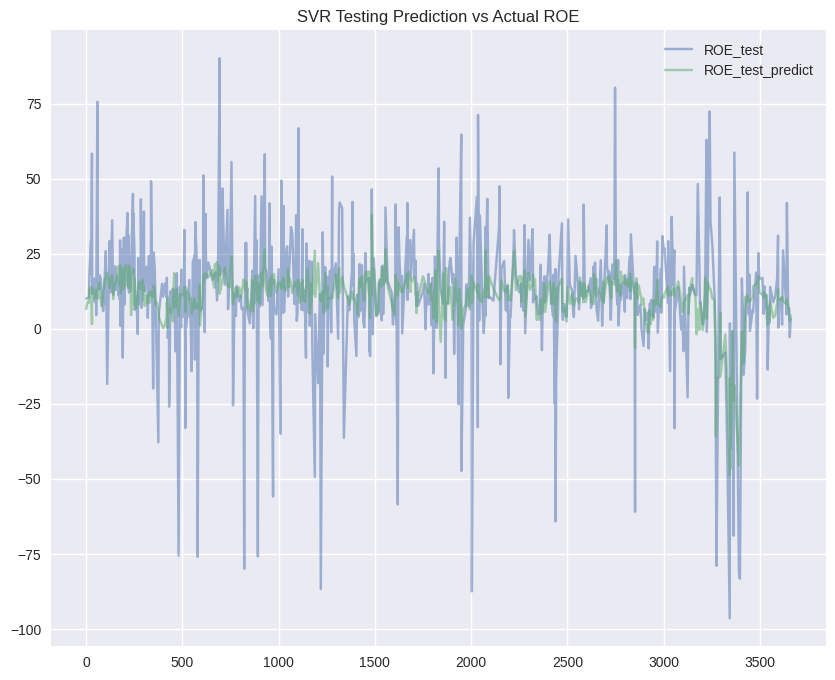

In [ ]:
#Plot the predicted ROE vs Actual ROE in TESTING dataset
svr_test_df[['ROE_test','ROE_test_predict']].sort_index().plot(alpha=0.5,
                                                               title='SVR Testing Prediction vs Actual ROE',
                                                               figsize=(10, 8))

<Axes: title={'center': 'SVR Training Prediction vs Actual ROE'}>

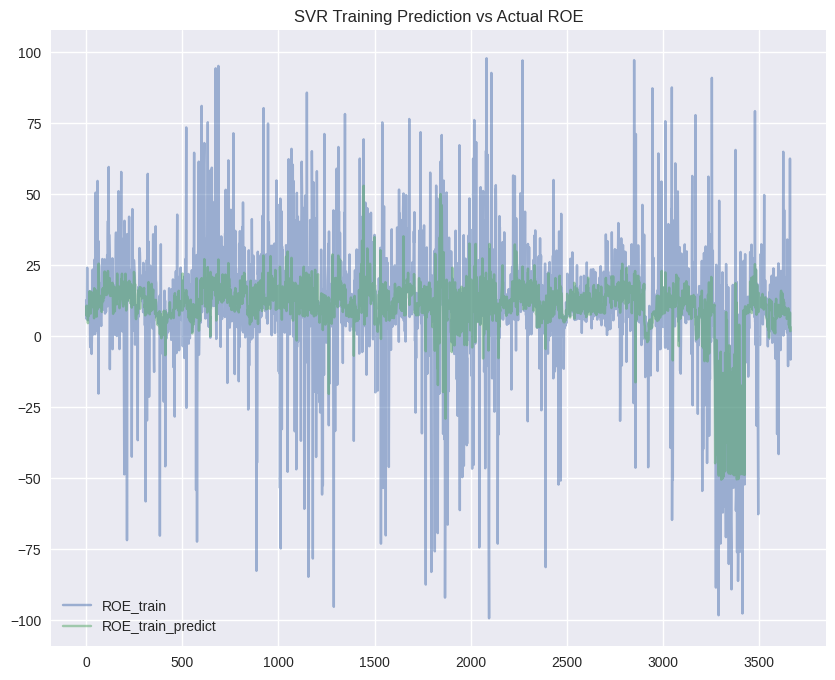

In [ ]:
#Plot the predicted ROE vs Actual ROE in TRAINING dataset
svr_train_df[['ROE_train','ROE_train_predict']].sort_index().plot(alpha=0.5,
                                                                  title='SVR Training Prediction vs Actual ROE',
                                                                  figsize=(10, 8))

In [ ]:
# Define functions returning SVR model performance measures

def svr_KPI(df, cols_list_x, output_column_y, c_value, gamma,epsilon, rs, df_text):
    from sklearn.ensemble import RandomForestRegressor
    from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
    import numpy as np

    # Results in tuple from nested function for svr through holdout method
    svr_output = svr_reg(df, cols_list_x, output_column_y, C, gamma, epsilon,rs)

    # Calculate the KPI metrics for the training dataset
    mse_train = mean_squared_error(svr_output['y_train'], svr_output['y_train_pred'])
    rmse_train = np.sqrt(mse_train)
    mae_train = mean_absolute_error(svr_output['y_train'], svr_output['y_train_pred'])
    rrse_train = np.sqrt(mse_train / np.var(svr_output['y_train']))
    rae_train = np.sum(np.abs(svr_output['y_train'] - svr_output['y_train_pred'])) / np.sum(np.abs(svr_output['y_train'] - svr_output['y_train'].mean()))

    # Calculate the KPI metrics for the test dataset
    mse_test = mean_squared_error(svr_output['y_test'], svr_output['y_test_pred'])
    rmse_test = np.sqrt(mse_test)
    mae_test = mean_absolute_error(svr_output['y_test'], svr_output['y_test_pred'])
    rrse_test = np.sqrt(mse_test / np.var(svr_output['y_test']))
    rae_test = np.sum(np.abs(svr_output['y_test'] - svr_output['y_test_pred'])) / np.sum(np.abs(svr_output['y_test'] - svr_output['y_test'].mean()))

    # Calculate adjusted R-squared
    ntest = len(svr_output['y_test'])
    ntrain = len(svr_output['y_train'])
    p = len(cols_list_x)

    r2_score_train = r2_score(svr_output['y_train'], svr_output['y_train_pred'])
    adjusted_r2_train = 1 - (1 - r2_score_train) * (ntrain - 1) / (ntrain - p - 1)
    r2_score_test = r2_score(svr_output['y_test'], svr_output['y_test_pred'])
    adjusted_r2_test= 1 - (1 - r2_score_test) * (ntest - 1) / (ntest - p - 1)

    # Calculate correlation coefficient
    r_train = np.corrcoef(svr_output['y_train'], svr_output['y_train_pred'])[0, 1]
    r_test = np.corrcoef(svr_output['y_test'], svr_output['y_test_pred'])[0, 1]

    # Create the performance report
    svr_test_performance = pd.DataFrame({"Dataset":df_text,
                                         "Hyper_C":c_value,
                                         "Hyper_Gamma":gamma,
                                         "Hyper_Epsilon":epsilon,
                                         "Hyper_randomseed":rs,
                                         "Category":'Test',
                                         "Adj_R_Square":adjusted_r2_test,
                                         "MSE":mse_test,
                                         "RMSE":rmse_test,
                                         "MAE":mae_test,
                                         "RRSE":rrse_test,
                                         "RAE":rae_test,
                                         "Corr_Coef":r_test}, index=[0]
                                        )
    svr_train_performance = pd.DataFrame({"Dataset":df_text,
                                          "Hyper_C":c_value,
                                          "Hyper_Gamma":gamma,
                                          "Hyper_Epsilon":epsilon,
                                          "Hyper_randomseed":rs,
                                          "Category":'Train',
                                          "Adj_R_Square":adjusted_r2_train,
                                          "MSE":mse_train,
                                          "RMSE":rmse_train,
                                          "MAE":mae_train,
                                          "RRSE":rrse_train,
                                          "RAE":rae_train,
                                          "Corr_Coef":r_train}, index=[0]
                                         )

    svr_model_performance = pd.concat([svr_test_performance,svr_train_performance], ignore_index=True)

    return svr_model_performance

In [ ]:
C = 100 # Higher C give better fit but more prone to overfitting
Gamma = 'scale' # Higher gamma give better fit
epsilon = 1 # Lower epsilon give better fit
rs = 42

svr_KPI(ALL_LGSE_Rn[Mask_no_OLI],features_x,'ROE',C,Gamma,epsilon,rs,'All companies')

,Dataset,Hyper_C,Hyper_Gamma,Hyper_Epsilon,Hyper_randomseed,Category,Adj_R_Square,MSE,RMSE,MAE,RRSE,RAE,Corr_Coef
0,All companies,100,scale,1,42,Test,0.193838,203.658630,14.270902,9.771922,0.821072,0.866686,0.579154
1,All companies,100,scale,1,42,Train,0.641602,109.112049,10.445671,5.815184,0.586282,0.511245,0.817222


# Prediction with Artificial Neural Network (ANN)

**Activation Function: ReLU (Rectified Linear Unit)**

Pros: Helps mitigate the vanishing gradient problem, computationally efficient, and allows for sparse activations.

Cons: Suffer from "dying ReLU" problem where neurons can get stuck at 0.
(The dying ReLU problem occurs when a neuron consistently outputs zero for all inputs. This can happen if a neuron's weights are updated in such a way that it only receives negative inputs, causing the ReLU activation to always output zero)

Best for: Hidden layers in many types of networks, especially deep networks.

**Activation Function: ELU (Exponential Linear Unit)**

Smooth version of ReLU

Can produce negative outputs

May converge faster and produce more accurate results


**Loss Function: MAE**

Pros: Less sensitive to outliers compared to MSE.

Cons: Provides less gradient for small errors compared to MSE.

Best for: Regression problems where outliers are a concern.


In [ ]:
# define functions for ANN

def ann_reg(df, cols_list_x, output_column_y, hidden_layers, epochs, batch_size, rs):
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import r2_score
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import Dense
    from tensorflow.keras.optimizers import Adam
    from tensorflow.keras.activations import relu, leaky_relu, elu, selu, tanh, linear

    x = df[cols_list_x]
    y = df[output_column_y]

    # Scale the input features (optional)
    from sklearn.preprocessing import StandardScaler
    scaler = StandardScaler()
    x = scaler.fit_transform(x)

    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=rs)

    model = Sequential()
    for i, units in enumerate(hidden_layers):
        if i == 0:
            model.add(Dense(units, activation='elu', input_shape=(x.shape[1],)))
        else:
            model.add(Dense(units, activation='elu'))
    model.add(Dense(1))

    model.compile(optimizer=Adam(), loss='mean_absolute_error')
    model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

    y_train_pred = model.predict(x_train).flatten()
    y_test_pred = model.predict(x_test).flatten()

    output = {'Model': model,
              'x_train': x_train, 'x_test': x_test,
              'y_train': y_train, 'y_test': y_test,
              'y_train_pred': y_train_pred, 'y_test_pred': y_test_pred}

    return output

In [ ]:
def ann_reg(df, cols_list_x, output_column_y, hidden_layers, epochs, batch_size, rs):
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import r2_score
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import Dense
    from tensorflow.keras.optimizers import Adam
    from tensorflow.keras.activations import relu, leaky_relu, elu, selu, tanh, linear

    # Prepare the data
    x = df[cols_list_x]
    y = df[output_column_y]

    # Scale the input features (optional)
    from sklearn.preprocessing import StandardScaler
    scaler = StandardScaler()
    x = scaler.fit_transform(x)

    # Split into train, validation, and test sets (60:20:20)
    x_train, x_temp, y_train, y_temp = train_test_split(x, y, test_size=0.4, random_state=rs)
    x_val, x_test, y_val, y_test = train_test_split(x_temp, y_temp, test_size=0.5, random_state=rs)

    # Build the model
    model = Sequential()
    model.add(Dense(hidden_layers[0], activation='elu', input_shape=(x_train.shape[1],)))
    for units in hidden_layers[1:]:
        model.add(Dense(units, activation='elu'))
    model.add(Dense(1))

    model.compile(optimizer=Adam(), loss='mae')

    # Train the model
    history = model.fit(x_train, y_train,
                        validation_data=(x_val, y_val),
                        epochs=epochs,
                        batch_size=batch_size,
                        verbose=0)

    # Predictions
    y_train_pred = model.predict(x_train).flatten()
    y_val_pred = model.predict(x_val).flatten()
    y_test_pred = model.predict(x_test).flatten()

    output = {'Model': model,
              'x_train': x_train, 'x_val': x_val, 'x_test': x_test,
              'y_train': y_train, 'y_val': y_val, 'y_test': y_test,
              'y_train_pred': y_train_pred, 'y_val_pred': y_val_pred, 'y_test_pred': y_test_pred,
              'history': history.history}

    return output

In [ ]:
hidden_layers = [15]
epochs = 60
batch_size = 128
rs = 42

ann_output = ann_reg(ALL_LGSE_R100_en, features_x, 'ROE', hidden_layers, epochs, batch_size, rs)

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


66/66 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


In [ ]:
# Put the training and testing output in a dataframe
ann_train_df = pd.DataFrame({'ROE_train':ann_output['y_train'],
                            'ROE_train_predict':ann_output['y_train_pred']
                           })

ann_test_df = pd.DataFrame({'ROE_test':ann_output['y_test'],
                           'ROE_test_predict':ann_output['y_test_pred']
                          })

<Axes: title={'center': 'ANN Testing Prediction vs Actual ROE'}>

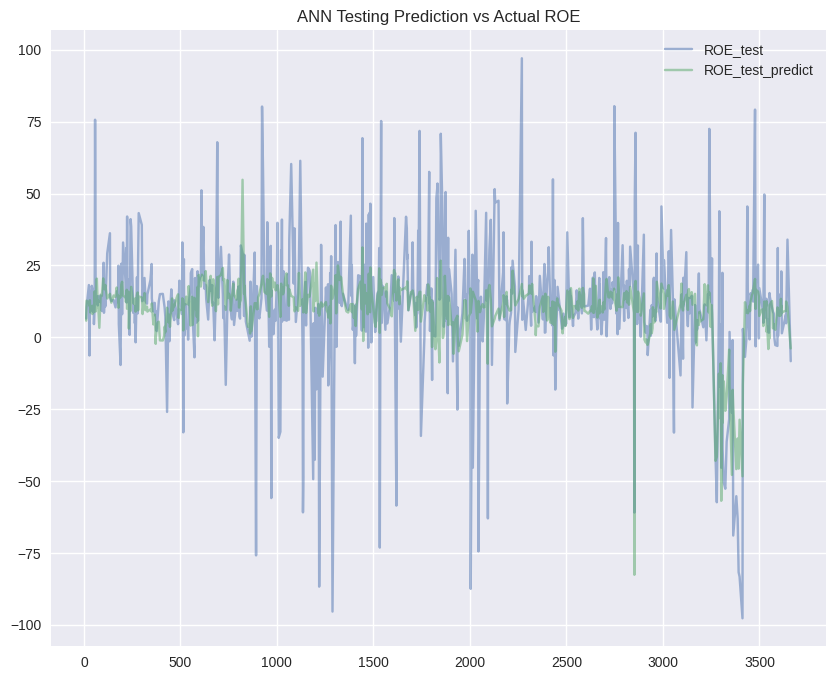

In [ ]:
#Plot the predicted ROE vs Actual ROE in TESTING dataset
ann_test_df[['ROE_test','ROE_test_predict']].sort_index().plot(alpha=0.5,
                                                               title='ANN Testing Prediction vs Actual ROE',
                                                               figsize=(10, 8))

<Axes: title={'center': 'ANN Training Prediction vs Actual ROE'}>

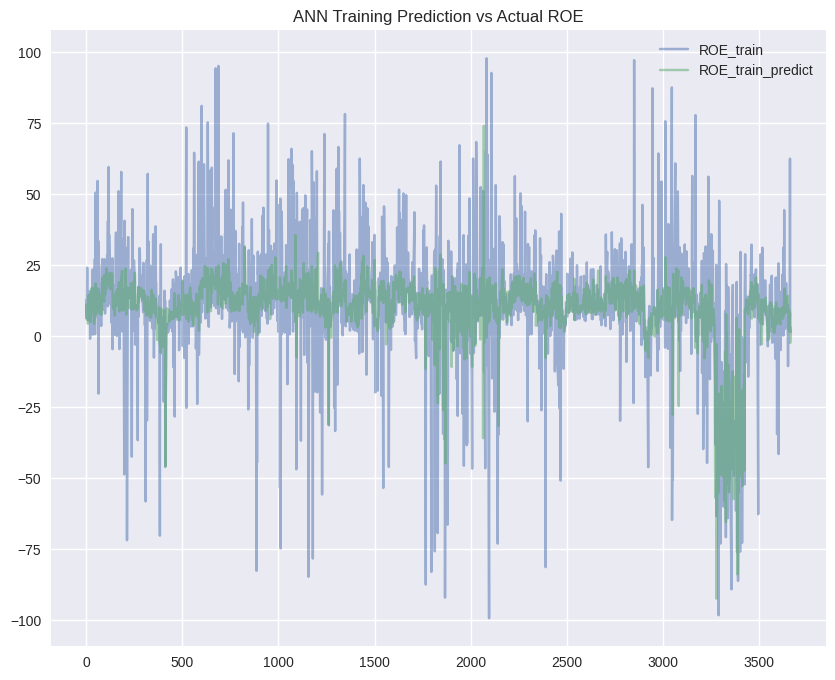

In [ ]:
#Plot the predicted ROE vs Actual ROE in TRAINING dataset
ann_train_df[['ROE_train','ROE_train_predict']].sort_index().plot(alpha=0.5,
                                                               title='ANN Training Prediction vs Actual ROE',
                                                               figsize=(10, 8))

In [ ]:
# Define functions returning ANN model performance measures

def ann_KPI(df, cols_list_x, output_column_y, hidden_layers, epochs, batch_size, rs, df_text):
    from sklearn.ensemble import RandomForestRegressor
    from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
    import numpy as np

    # Results in tuple from nested function for ann through holdout method
    ann_output = ann_reg(df, cols_list_x, output_column_y, hidden_layers, epochs, batch_size, rs)

    # Calculate the KPI metrics for the training dataset
    mse_train = mean_squared_error(ann_output['y_train'], ann_output['y_train_pred'])
    rmse_train = np.sqrt(mse_train)
    mae_train = mean_absolute_error(ann_output['y_train'], ann_output['y_train_pred'])
    rrse_train = np.sqrt(mse_train / np.var(ann_output['y_train']))
    rae_train = np.sum(np.abs(ann_output['y_train'] - ann_output['y_train_pred'])) / np.sum(np.abs(ann_output['y_train'] - ann_output['y_train'].mean()))

    # Calculate the KPI metrics for the test dataset
    mse_test = mean_squared_error(ann_output['y_test'], ann_output['y_test_pred'])
    rmse_test = np.sqrt(mse_test)
    mae_test = mean_absolute_error(ann_output['y_test'], ann_output['y_test_pred'])
    rrse_test = np.sqrt(mse_test / np.var(ann_output['y_test']))
    rae_test = np.sum(np.abs(ann_output['y_test'] - ann_output['y_test_pred'])) / np.sum(np.abs(ann_output['y_test'] - ann_output['y_test'].mean()))

    # Calculate adjusted R-squared
    ntest = len(ann_output['y_test'])
    ntrain = len(ann_output['y_train'])
    p = len(cols_list_x)

    r2_score_train = r2_score(ann_output['y_train'], ann_output['y_train_pred'])
    adjusted_r2_train = 1 - (1 - r2_score_train) * (ntrain - 1) / (ntrain - p - 1)
    r2_score_test = r2_score(ann_output['y_test'], ann_output['y_test_pred'])
    adjusted_r2_test= 1 - (1 - r2_score_test) * (ntest - 1) / (ntest - p - 1)

    # Calculate correlation coefficient
    r_train = np.corrcoef(ann_output['y_train'], ann_output['y_train_pred'])[0, 1]
    r_test = np.corrcoef(ann_output['y_test'], ann_output['y_test_pred'])[0, 1]

    # Create the performance report
    ann_test_performance = pd.DataFrame({"Dataset":df_text,
                                         "Hyper_Hidden_layer":str(hidden_layers),
                                         "Hyper_Epochs":epochs,
                                         "Hyper_batch_size":batch_size,
                                         "Hyper_randomseed":rs,
                                         "Category":'Test',
                                         "Adj_R_Square":adjusted_r2_test,
                                         "MSE":mse_test,
                                         "RMSE":rmse_test,
                                         "MAE":mae_test,
                                         "RRSE":rrse_test,
                                         "RAE":rae_test,
                                         "Corr_Coef":r_test}, index=[0]
                                        )
    ann_train_performance = pd.DataFrame({"Dataset":df_text,
                                          "Hyper_Hidden_layer":str(hidden_layers),
                                          "Hyper_Epochs":epochs,
                                          "Hyper_batch_size":batch_size,
                                          "Hyper_randomseed":rs,
                                          "Category":'Train',
                                          "Adj_R_Square":adjusted_r2_train,
                                          "MSE":mse_train,
                                          "RMSE":rmse_train,
                                          "MAE":mae_train,
                                          "RRSE":rrse_train,
                                          "RAE":rae_train,
                                          "Corr_Coef":r_train}, index=[0]
                                         )

    ann_model_performance = pd.concat([ann_test_performance,ann_train_performance], ignore_index=True)

    return ann_model_performance

In [ ]:
ALL_LGSE_Rn = ALL_LGSE_R100_en

In [ ]:
# Measures ANN model performance

hidden_layers = [15]
epochs = 75
batch_size = 32
rs = 42

ann_KPI(ALL_LGSE_Rn[Mask_no_OLI], features_x, 'ROE', hidden_layers, epochs, batch_size, rs, 'All companies')

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


,Dataset,Hyper_Hidden_layer,Hyper_Epochs,Hyper_batch_size,Hyper_randomseed,Category,Adj_R_Square,MSE,RMSE,MAE,RRSE,RAE,Corr_Coef
0,All companies,[15],75,32,42,Test,0.127596,224.428698,14.980944,10.135763,0.854140,0.891148,0.540934
1,All companies,[15],75,32,42,Train,0.433981,168.213890,12.969730,8.056702,0.731523,0.708867,0.684097


# Model Selection

Total 4 ML alglorithms are applied. The observations and features applied are summarized as below:

(1) LR [ALL_LGSE_R100_en[Mask_no_OLI], features_x_bs_no_mc]

(2) RF [ALL_LGSE_R100_en, features_x]

(3) SVR [ALL_LGSE_R100_en, features_x]

(4) ANNs [ALL_LGSE_R100_en, features_x]

To compare model performances, the same mask [Mask_no_OLI] will be applied in model building in RF, SVR and ANNs

In [ ]:
# @title Best Parameters Determination

Random Forest

In [ ]:
# Define list of RF parameters

no_tree_list = [200,400,600]
max_features_list = [None,'sqrt', 0.5, 0.7]
max_samples_list = [None, 0.7, 0.9]
rs = 42


In [ ]:
# Search for best performing parameters with masks

scenario_rf_df=pd.DataFrame()
for i in no_tree_list:
  for j in max_features_list:
    for k in max_samples_list:
      temp_df = random_forest_KPI(ALL_LGSE_Rn[Mask_no_OLI], features_x, 'ROE',i,rs,'All companies(exclude OLI)', max_f=j, max_s=k)
      scenario_rf_df = pd.concat([scenario_rf_df,temp_df], ignore_index=True)

scenario_rf_df

,Dataset,Hyper_Tree_no,Hyper_randomseed,Category,Adj_R_Square,MSE,RMSE,MAE,RRSE,RAE,Corr_Coef
0,All companies(exclude OLI),200,42,Test,0.492876,128.113422,11.318720,7.544039,0.651219,0.669092,0.758995
1,All companies(exclude OLI),200,42,Train,0.938006,18.873636,4.344380,2.819907,0.243836,0.247914,0.978293
2,All companies(exclude OLI),200,42,Test,0.485043,130.092193,11.405796,7.660693,0.656229,0.679438,0.754842
3,All companies(exclude OLI),200,42,Train,0.887062,34.383350,5.863732,3.832885,0.329113,0.336970,0.956798
4,All companies(exclude OLI),200,42,Test,0.487673,129.427779,11.376633,7.560952,0.654551,0.670592,0.756071
...,...,...,...,...,...,...,...,...,...,...,...
67,All companies(exclude OLI),600,42,Train,0.938575,18.700362,4.324391,2.802130,0.242714,0.246351,0.979027
68,All companies(exclude OLI),600,42,Test,0.479916,131.387442,11.462436,7.633254,0.659488,0.677005,0.752010
69,All companies(exclude OLI),600,42,Train,0.888491,33.948338,5.826520,3.809220,0.327024,0.334890,0.958345
70,All companies(exclude OLI),600,42,Test,0.489481,128.970979,11.356539,7.549523,0.653395,0.669579,0.757228


In [ ]:
# Assign multiple ouputs into a single tuple
rf_output = random_forest_reg(ALL_LGSE_Rn[Mask_no_OLI],features_x,'ROE',tree_no,rs)

In [ ]:
# Grid Search for best combination of parameters

from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor

# Define the parameter grid
param_grid = {
    'n_estimators': [200, 400, 600],
    'max_features': [None,'sqrt', 0.5, 0.7],
    'max_samples': [None, 0.7, 0.9]
}

# Initialize the Random Forest model
rf = RandomForestRegressor(random_state=42)

# Set up GridSearchCV
grid_search = GridSearchCV(
    estimator=rf,
    param_grid=param_grid,
    cv=5,
    scoring='neg_mean_squared_error',
    n_jobs=-1,
    verbose=2
)

# Assuming you have your data split into x_train and y_train
grid_search.fit(rf_output['x_train'], rf_output['y_train'])

# Print the best parameters and score
print("Best parameters:", grid_search.best_params_)
print("Best score (MSE):", -grid_search.best_score_)

Fitting 5 folds for each of 36 candidates, totalling 180 fits
Best parameters: {'max_features': 0.5, 'max_samples': 0.9, 'n_estimators': 600}
Best score (MSE): 139.16161215652974


Support Vector Regression

In [ ]:
# Define lists of SVR parameters
c_list = [0.1,1.0,100]
Gamma_value_list = ['scale',0.0125,0.025]
epsilon_list = [0.01,0.5,1.0]
rs=42

In [ ]:
# Search for best performing hyperparameter value with masks
scenario_svr_df=pd.DataFrame()
for i in Gamma_value_list:
  for j in c_list:
    for k in epsilon_list:
      temp_df=svr_KPI(ALL_LGSE_Rn[Mask_no_OLI],features_x,'ROE',j,i,k,rs,'All companies')
      scenario_svr_df = pd.concat([scenario_svr_df,temp_df], ignore_index=True)

scenario_svr_df

,Dataset,Hyper_C,Hyper_Gamma,Hyper_Epsilon,Hyper_randomseed,Category,Adj_R_Square,MSE,RMSE,MAE,RRSE,RAE,Corr_Coef
0,All companies,0.1,scale,0.01,42,Test,0.185755,205.700669,14.342269,9.842680,0.825178,0.872962,0.574722
1,All companies,0.1,scale,0.01,42,Train,0.638278,110.124020,10.493999,5.519636,0.588995,0.485262,0.814253
2,All companies,0.1,scale,0.50,42,Test,0.189031,204.873058,14.313387,9.814602,0.823516,0.870472,0.576353
3,All companies,0.1,scale,0.50,42,Train,0.640207,109.536593,10.465973,5.666818,0.587422,0.498202,0.815866
4,All companies,0.1,scale,1.00,42,Test,0.193838,203.658630,14.270902,9.771922,0.821072,0.866686,0.579154
5,All companies,0.1,scale,1.00,42,Train,0.641602,109.112049,10.445671,5.815184,0.586282,0.511245,0.817222
6,All companies,1.0,scale,0.01,42,Test,0.185755,205.700669,14.342269,9.842680,0.825178,0.872962,0.574722
7,All companies,1.0,scale,0.01,42,Train,0.638278,110.124020,10.493999,5.519636,0.588995,0.485262,0.814253
8,All companies,1.0,scale,0.50,42,Test,0.189031,204.873058,14.313387,9.814602,0.823516,0.870472,0.576353
9,All companies,1.0,scale,0.50,42,Train,0.640207,109.536593,10.465973,5.666818,0.587422,0.498202,0.815866


In [ ]:
# Create SVR output for searching parameters
svr_output = svr_reg(ALL_LGSE_Rn[Mask_no_OLI],features_x,'ROE',C,gamma,epsilon,rs)

In [ ]:
# Grid Search for best combination of parameters
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVR

param_grid = [
    {'kernel': ['rbf'],
     'gamma': ['scale', 'auto', 0.1, 1],
     'C': [0.1, 1, 10, 100],
     'epsilon': [0.01, 0.1, 0.5, 1.0]},

    {'kernel': ['poly'],
     'degree': [2, 3, 4],
     'C': [0.1, 1, 10, 100],
     'epsilon': [0.01, 0.1, 0.5, 1.0]},

    {'kernel': ['sigmoid'],
     'gamma': ['scale', 'auto', 0.1, 1],
     'C': [0.1, 1, 10, 100],
     'epsilon': [0.01, 0.1, 0.5, 1.0]}
]


svr = SVR()
grid_search = GridSearchCV(svr, param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
grid_search.fit(svr_output['x_train'], svr_output['y_train'])

print("Best parameters:", grid_search.best_params_)
print("Best score:", -grid_search.best_score_)

Best parameters: {'C': 100, 'epsilon': 1.0, 'gamma': 'scale', 'kernel': 'rbf'}
Best score: 204.4178351406379


In [ ]:
# Higher value give better fit but risk overfitting
C = 100.0
# Hyperparameters for SVR as RBF kernal
gamma = 'scale'
# Hyperparameters for SVR as margin of tolerance
epsilon=1

rs = 42

svr_output = svr_reg(ALL_LGSE_Rn[Mask_no_OLI],features_x,'ROE',C,gamma,epsilon,rs)

In [ ]:
# Display the gamma value in the best performing SVR model

from sklearn.svm import SVR

# Create and fit the model
svr = SVR(kernel='rbf', gamma='scale')  # or 'auto'
svr.fit(svr_output['x_train'], svr_output['y_train'])

# Get the number of features
n_features = svr_output['x_train'].shape[1]

# Calculate 'scale' gamma
gamma_scale = 1 / (n_features * svr_output['x_train'].var())

# Calculate 'auto' gamma
gamma_auto = 1 / n_features

# Get the actual gamma used by the model
gamma_used = svr._gamma

print(f"Gamma 'scale': {gamma_scale}")
print(f"Gamma 'auto': {gamma_auto}")
print(f"Gamma used by the model: {gamma_used}")

Gamma 'scale': 0.00880070404793481
Gamma 'auto': 0.008928571428571428
Gamma used by the model: 0.00880070404793481


Artificial Neural Network (ANN)

In [ ]:
# Define lists of ANNs parameters
hidden_layers_list = [[15],[13],[10]]
epochs_list = [50,60,75,100]
batch_list = [128,64,32]
rs = 42


In [ ]:
# Measures ANN model performance with masks
scenario_ann_df=pd.DataFrame()

for k in hidden_layers_list:
  for i in epochs_list:
    for j in batch_list:
      temp_df=ann_KPI(ALL_LGSE_Rn[Mask_no_OLI], features_x, 'ROE', k, i, j, rs, 'All companies')
      scenario_ann_df = pd.concat([scenario_ann_df,temp_df], ignore_index=True)



/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


65/65 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


65/65 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


In [ ]:
scenario_ann_df

,Dataset,Hyper_Hidden_layer,Hyper_Epochs,Hyper_batch_size,Hyper_randomseed,Category,Adj_R_Square,MSE,RMSE,MAE,RRSE,RAE,Corr_Coef
0,All companies,[15],50,128,42,Test,0.068704,239.578754,15.478332,10.543759,0.882498,0.927019,0.484157
1,All companies,[15],50,128,42,Train,0.343209,195.190018,13.971042,9.223864,0.787999,0.811559,0.628144
2,All companies,[15],50,64,42,Test,0.142317,220.641656,14.854011,10.210910,0.846903,0.897755,0.539446
3,All companies,[15],50,64,42,Train,0.381421,183.834043,13.558541,8.771207,0.764733,0.771732,0.651579
4,All companies,[15],50,32,42,Test,0.130991,223.555261,14.951764,10.199779,0.852476,0.896776,0.537839
...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,All companies,[10],100,128,42,Train,0.377048,185.133493,13.606377,8.869641,0.767431,0.780393,0.649722
68,All companies,[10],100,64,42,Test,0.124216,225.298125,15.009934,10.221286,0.855792,0.898667,0.535092
69,All companies,[10],100,64,42,Train,0.416246,173.484523,13.171352,8.363297,0.742895,0.735842,0.674440
70,All companies,[10],100,32,42,Test,0.165331,214.721048,14.653363,9.989482,0.835463,0.878287,0.563813
